# 1) Import the libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os, sys, datetime, re , glob
from os import listdir
import math
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
data_path ="D:\IBM_B2B_C_Onboarding\Competitive_Item_Verification_(CIV)\POOIM_Export_with_Secondary_Specs"
filenames = os.listdir(data_path)
# print(filenames)

# 2) Load the POOIM Export with Secondary Specs Dataset (Export_Explorer_POOIM Catalog_07-02-2023_07-43-32.xlsx)

In [3]:
df_POOIM_Export1 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-43-32.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export1.head()

,Unnamed: 0,Unnamed: 1,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,...,Product specific battery packs Secondary Spec/Height/UOM,Product specific battery packs Secondary Spec/Width/Display Value,Product specific battery packs Secondary Spec/Width/Absolute Value,Product specific battery packs Secondary Spec/Width/UOM,Product specific battery packs Secondary Spec/Depth/Display Value,Product specific battery packs Secondary Spec/Depth/Absolute Value,Product specific battery packs Secondary Spec/Depth/UOM,Product specific battery packs Secondary Spec/Weight _Approximate_#0/Display Value,Product specific battery packs Secondary Spec/Weight _Approximate_#0/Absolute Value,Product specific battery packs Secondary Spec/Weight _Approximate_#0/UOM
0,Foundational Hierarchy /26000000/26110000/2611...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-8k4537,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640704286887,im1-8k4537,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Foundational Hierarchy /26000000/26110000/2611...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-6tu743,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640704008849,im1-6tu743,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Foundational Hierarchy /26000000/26110000/2611...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-tu2403,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703807249,im1-tu2403,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Foundational Hierarchy /26000000/26110000/2611...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-f28881,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703762753,im1-f28881,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Foundational Hierarchy /26000000/26110000/2611...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-gu0175,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703765594,im1-gu0175,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df_POOIM_Export1= df_POOIM_Export1.loc[:, df_POOIM_Export1.columns != 'Unnamed: 0']
df_POOIM_Export1= df_POOIM_Export1.loc[:, df_POOIM_Export1.columns != 'Unnamed: 1']

In [5]:
df_POOIM_Export1.head()

,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,POOIM Primary Spec/Identifiers/ECCN,POOIM Primary Spec/Identifiers/ISBN,...,Product specific battery packs Secondary Spec/Height/UOM,Product specific battery packs Secondary Spec/Width/Display Value,Product specific battery packs Secondary Spec/Width/Absolute Value,Product specific battery packs Secondary Spec/Width/UOM,Product specific battery packs Secondary Spec/Depth/Display Value,Product specific battery packs Secondary Spec/Depth/Absolute Value,Product specific battery packs Secondary Spec/Depth/UOM,Product specific battery packs Secondary Spec/Weight _Approximate_#0/Display Value,Product specific battery packs Secondary Spec/Weight _Approximate_#0/Absolute Value,Product specific battery packs Secondary Spec/Weight _Approximate_#0/UOM
0,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-8k4537,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640704286887,im1-8k4537,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-6tu743,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640704008849,im1-6tu743,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-tu2403,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703807249,im1-tu2403,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-f28881,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703762753,im1-f28881,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-gu0175,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703765594,im1-gu0175,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df_POOIM_Export1.shape

(192, 116)

In [7]:
df_POOIM_Export1.size

22272

In [8]:
# df_POOIM_Export1.dtypes

In [9]:
df_POOIM_Export1.isna().sum().to_frame()

,0
POOIM Primary Spec/Product ID,0
POOIM Primary Spec/Seller ID,0
POOIM Primary Spec/Buyer ID,0
POOIM Primary Spec/Version,0
POOIM Primary Spec/Identifiers/SKU,0
...,...
Product specific battery packs Secondary Spec/Depth/Absolute Value,192
Product specific battery packs Secondary Spec/Depth/UOM,192
Product specific battery packs Secondary Spec/Weight _Approximate_#0/Display Value,192
Product specific battery packs Secondary Spec/Weight _Approximate_#0/Absolute Value,192


In [10]:
# df_POOIM_Export1.columns

# 3) Check for the values present for all the categories

In [11]:
# Finding all the column names in POOIM Export Catalog Excel file
COL = []
for col in df_POOIM_Export1.columns:
    # print(col)
    COL.append(col)
# print("All Column names present in POOIM Export Catalog: \n", COL)

In [12]:
# # Find the primary specs column names
# for col_primary in df_POOIM_Export1.columns:
#     if 'POOIM Primary Spec' in col_primary:
#         print(col_primary)

In [13]:
# # Find the secondary specs column names
# for col_secondary in df_POOIM_Export1.columns:
#     if 'Secondary Spec' in col_secondary:
#         print(col_secondary)

In [14]:
# Find the percentage of values present in Product ID
product_id_count = df_POOIM_Export1['POOIM Primary Spec/Product ID'].shape[0]
print("Product ID Count : ", product_id_count)
product_id_present = df_POOIM_Export1['POOIM Primary Spec/Product ID'].notnull().sum()
print("Product ID Present :",product_id_present)
perc_product_id = (product_id_present/product_id_count)*100
print("Product ID Perc: ",perc_product_id, "%")

Product ID Count :  192
Product ID Present : 192
Product ID Perc:  100.0 %


In [15]:
# Find the percentage of values present in Seller ID
seller_id_count = df_POOIM_Export1['POOIM Primary Spec/Seller ID'].shape[0]
print("Seller ID Count : ", seller_id_count)
seller_id_present = df_POOIM_Export1['POOIM Primary Spec/Seller ID'].notnull().sum()
print("Seller ID Present :",seller_id_present)
perc_seller_id = (seller_id_present/seller_id_count)*100
print("Seller ID Perc: ",perc_seller_id, "%")

Seller ID Count :  192
Seller ID Present : 192
Seller ID Perc:  100.0 %


In [16]:
# Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
perc_available = []
for (columnName, columnData) in df_POOIM_Export1.iteritems():
    # print('Column Name : ', columnName)
    # print('Column Contents : \n', columnData.values)
    row_count = columnData.shape[0]
    print('Row Count : ',row_count)
    rows_present = columnData.notnull().sum()
    print('Row values Present : ',rows_present)
    rows_perc = (rows_present/row_count)*100
    print('Row values Present Perc : ',rows_perc ,"%")
    perc_available.append(rows_perc)
    print('*************************************************************')

Row Count :  192
Row values Present :  192
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  192
Row values Present :  192
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  192
Row values Present :  192
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  192
Row values Present :  192
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  192
Row values Present :  192
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  192
Row values Present :  5
Row values Present Perc :  2.604166666666667 %
*************************************************************
Row Count :  192
Row values Present :  5
Row values Present Perc :  2.604166666666667 %
*************************************************************


In [17]:
print(row_count)

192


In [18]:
print(perc_available)

[100.0, 100.0, 100.0, 100.0, 100.0, 2.604166666666667, 2.604166666666667, 2.604166666666667, 0.0, 0.0, 0.0, 0.0, 100.0, 100.0, 5.729166666666666, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 95.3125, 100.0, 100.0, 100.0, 3.6458333333333335, 1.0416666666666665, 0.0, 100.0, 100.0, 80.72916666666666, 80.72916666666666, 4.6875, 4.6875, 4.6875, 4.6875, 2.604166666666667, 2.604166666666667, 0.0, 0.0, 100.0, 100.0, 100.0, 2.604166666666667, 100.0, 0.0, 100.0, 2.604166666666667, 1.0416666666666665, 2.604166666666667, 1.5625, 0.0, 2.604166666666667, 1.0416666666666665, 1.0416666666666665, 0.0, 1.5625, 2.604166666666667, 2.604166666666667, 0.0, 0.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [19]:
# print(COL)

# 4) Save the Percentages of all the categories in new sheet "Volumetric Stats"

## 4.1) Create an empty dataframe 

In [20]:
col_names =  ['Column Name', 'Percentage Available']
volumetric_stats  = pd.DataFrame(columns = col_names)
volumetric_stats
# append data in columns to an empty pandas DataFrame
volumetric_stats['Column Name'] = COL
volumetric_stats['Percentage Available'] = perc_available
volumetric_stats

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0
...,...,...
111,Product specific battery packs Secondary Spec/...,0.0
112,Product specific battery packs Secondary Spec/...,0.0
113,Product specific battery packs Secondary Spec/...,0.0
114,Product specific battery packs Secondary Spec/...,0.0


In [21]:
volumetric_stats.shape

(116, 2)

In [22]:
volumetric_stats.size

232

## 4.2) Save the dataframe in a new sheet to the existing file

In [23]:
# from openpyxl import load_workbook
# excel_path = "D:\IBM_B2B_C_Onboarding\Competitive_Item_Verification_(CIV)POOIM Export with Secondary Specs\Export_Explorer_POOIM Catalog_07-02-2023_07-43-32.xlsx"
# book = load_workbook(excel_path)
# writer = pd.ExcelWriter(excel_path, engine = 'openpyxl')
# writer.book = book
# writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
# volumetric_stats.to_excel(writer,sheet_name='Volumetric_Stats',index=False)
# writer.save()

# 5) Performing Volumetric Stats for Export_Explorer_POOIM Catalog_07-02-2023_07-44-54.xlsx

In [24]:
df_POOIM_Export2 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-44-54.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export2.head()

,Unnamed: 0,Unnamed: 1,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,...,Storage drive or input device components Secondary Spec/Width/UOM,Storage drive or input device components Secondary Spec/Depth/Display Value,Storage drive or input device components Secondary Spec/Depth/Absolute Value,Storage drive or input device components Secondary Spec/Depth/UOM,Storage drive or input device components Secondary Spec/Weight _Approximate_/Display Value,Storage drive or input device components Secondary Spec/Weight _Approximate_/Absolute Value,Storage drive or input device components Secondary Spec/Weight _Approximate_/UOM,Storage drive or input device components Secondary Spec/Compatibility,Storage drive or input device components Secondary Spec/Energy Star,Storage drive or input device components Secondary Spec/TCO Certified
0,Foundational Hierarchy /32000000/32100000/3210...,Foundational Hierarchy /32000000/32100000/3210...,87b00c11-fa06-4f49-93a1-f17d1ecc39c5_32730526,87b00c11-fa06-4f49-93a1-f17d1ecc39c5,8d847c55-5290-4094-a834-309961797c8b,1643834053349,32730526,8.039311e+11,1.907939e+11,8.039311e+11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Foundational Hierarchy /32000000/32100000/3210...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-k10156,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703772481,im1-k10156,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Foundational Hierarchy /32000000/32100000/3210...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_222cxd749,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826831174,222cxd749,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Foundational Hierarchy /32000000/32100000/3210...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_223gjp835,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826875037,223gjp835,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Foundational Hierarchy /32000000/32100000/3210...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_222zwu936,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826868054,222zwu936,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
df_POOIM_Export2= df_POOIM_Export2.loc[:, df_POOIM_Export2.columns != 'Unnamed: 0']
df_POOIM_Export2= df_POOIM_Export2.loc[:, df_POOIM_Export2.columns != 'Unnamed: 1']

In [26]:
df_POOIM_Export2.head()

,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,POOIM Primary Spec/Identifiers/ECCN,POOIM Primary Spec/Identifiers/ISBN,...,Storage drive or input device components Secondary Spec/Width/UOM,Storage drive or input device components Secondary Spec/Depth/Display Value,Storage drive or input device components Secondary Spec/Depth/Absolute Value,Storage drive or input device components Secondary Spec/Depth/UOM,Storage drive or input device components Secondary Spec/Weight _Approximate_/Display Value,Storage drive or input device components Secondary Spec/Weight _Approximate_/Absolute Value,Storage drive or input device components Secondary Spec/Weight _Approximate_/UOM,Storage drive or input device components Secondary Spec/Compatibility,Storage drive or input device components Secondary Spec/Energy Star,Storage drive or input device components Secondary Spec/TCO Certified
0,87b00c11-fa06-4f49-93a1-f17d1ecc39c5_32730526,87b00c11-fa06-4f49-93a1-f17d1ecc39c5,8d847c55-5290-4094-a834-309961797c8b,1643834053349,32730526,8.039311e+11,1.907939e+11,8.039311e+11,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-k10156,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703772481,im1-k10156,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,325b03e8-4d12-43df-8782-52f67ab2d38c_222cxd749,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826831174,222cxd749,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,325b03e8-4d12-43df-8782-52f67ab2d38c_223gjp835,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826875037,223gjp835,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,325b03e8-4d12-43df-8782-52f67ab2d38c_222zwu936,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826868054,222zwu936,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df_POOIM_Export2.shape

(500, 397)

In [28]:
df_POOIM_Export2.size

198500

In [29]:
# df_POOIM_Export2.dtypes

In [30]:
df_POOIM_Export2.isna().sum().to_frame()

,0
POOIM Primary Spec/Product ID,0
POOIM Primary Spec/Seller ID,0
POOIM Primary Spec/Buyer ID,0
POOIM Primary Spec/Version,0
POOIM Primary Spec/Identifiers/SKU,0
...,...
Storage drive or input device components Secondary Spec/Weight _Approximate_/Absolute Value,500
Storage drive or input device components Secondary Spec/Weight _Approximate_/UOM,500
Storage drive or input device components Secondary Spec/Compatibility,500
Storage drive or input device components Secondary Spec/Energy Star,500


In [31]:
# df_POOIM_Export2.columns

## 5.1) Check for the values present for all the categories

In [32]:
Col = []
for col in df_POOIM_Export2.columns:
    # print(col)
    Col.append(col)
# print("All Column names present in POOIM Export Catalog: \n", Col)

In [33]:
# # Find the primary specs column names
# for col_primary in df_POOIM_Export2.columns:
#     if 'POOIM Primary Spec' in col_primary:
#         print(col_primary)

In [34]:
# # Find the secondary specs column names
# for col_secondary in df_POOIM_Export2.columns:
#     if 'Secondary Spec' in col_secondary:
#         print(col_secondary)

In [35]:
# Find the percentage of values present in Product ID
product_id_count = df_POOIM_Export2['POOIM Primary Spec/Product ID'].shape[0]
print("Product ID Count : ", product_id_count)
product_id_present = df_POOIM_Export2['POOIM Primary Spec/Product ID'].notnull().sum()
print("Product ID Present :",product_id_present)
perc_product_id = (product_id_present/product_id_count)*100
print("Product ID Perc: ",perc_product_id, "%")

Product ID Count :  500
Product ID Present : 500
Product ID Perc:  100.0 %


In [36]:
# Find the percentage of values present in Seller ID
seller_id_count = df_POOIM_Export2['POOIM Primary Spec/Seller ID'].shape[0]
print("Seller ID Count : ", seller_id_count)
seller_id_present = df_POOIM_Export2['POOIM Primary Spec/Seller ID'].notnull().sum()
print("Seller ID Present :",seller_id_present)
perc_seller_id = (seller_id_present/seller_id_count)*100
print("Seller ID Perc: ",perc_seller_id, "%")

Seller ID Count :  500
Seller ID Present : 500
Seller ID Perc:  100.0 %


## 5.2) Find the percentage of values present in all the column names in POOIM Export Catalog Excel file

In [37]:
Perc_available = []
for (columnName2, columnData2) in df_POOIM_Export2.iteritems():
    # print('Column Name : ', columnName2)
    # print('Column Contents : \n', columnData2.values)
    row_count2 = columnData2.shape[0]
    print('Row Count : ',row_count2)
    rows_present2 = columnData2.notnull().sum()
    print('Row values Present : ',rows_present2)
    rows_perc2 = (rows_present2/row_count2)*100
    print('Row values Present Perc : ',rows_perc2 ,"%")
    Perc_available.append(rows_perc2)
    print('*************************************************************')

Row Count :  500
Row values Present :  500
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  500
Row values Present :  500
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  500
Row values Present :  500
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  500
Row values Present :  500
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  500
Row values Present :  500
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  500
Row values Present :  327
Row values Present Perc :  65.4 %
*************************************************************
Row Count :  500
Row values Present :  329
Row values Present Perc :  65.8 %
*************************************************************
Row Count :  500
Row v

In [38]:
print(row_count2)
print(Perc_available)
# print(Col)

500
[100.0, 100.0, 100.0, 100.0, 100.0, 65.4, 65.8, 65.8, 0.0, 0.0, 0.0, 0.0, 100.0, 97.8, 2.1999999999999997, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 97.8, 100.0, 100.0, 100.0, 81.0, 4.0, 0.0, 100.0, 100.0, 98.6, 98.6, 90.60000000000001, 90.60000000000001, 71.39999999999999, 71.39999999999999, 62.8, 62.8, 4.8, 4.8, 4.8, 4.8, 4.6, 4.8, 4.6, 4.8, 4.6, 4.8, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 4.3999999999999995, 

## 5.3) Save the Percentages of all the categories in new sheet "Volumetric Stats"

In [39]:
# Create an empty dataframe
col_names2 =  ['Column Name', 'Percentage Available']
volumetric_stats2  = pd.DataFrame(columns = col_names2)
volumetric_stats2
# append data in columns to an empty pandas DataFrame
volumetric_stats2['Column Name'] = Col
volumetric_stats2['Percentage Available'] = Perc_available
volumetric_stats2

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0
...,...,...
392,Storage drive or input device components Secon...,0.0
393,Storage drive or input device components Secon...,0.0
394,Storage drive or input device components Secon...,0.0
395,Storage drive or input device components Secon...,0.0


In [40]:
volumetric_stats2.shape

(397, 2)

In [41]:
volumetric_stats2.size

794

## 5.4) Save the dataframe in a new sheet to the existing file


In [42]:
# excel_path = "D:\IBM_B2B_C_Onboarding\Competitive_Item Verification_(CIV)\POOIM Export with Secondary Specs\Export_Explorer_POOIM Catalog_07-02-2023_07-44-54.xlsx"
# book = load_workbook(excel_path)
# writer = pd.ExcelWriter(excel_path, engine = 'openpyxl')
# writer.book = book
# writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
# volumetric_stats.to_excel(writer,sheet_name='Volumetric_Stats',index=False)
# writer.save()

# 6) Performing Volumetric Stats for Export_Explorer_POOIM Catalog_07-02-2023_07-46-28.xlsx

In [43]:
df_POOIM_Export3 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-46-28.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export3.head()

,Unnamed: 0,Unnamed: 1,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,...,Random access memory RAM Secondary Spec/Thickness/UOM,Random access memory RAM Secondary Spec/Width/Display Value,Random access memory RAM Secondary Spec/Width/Absolute Value,Random access memory RAM Secondary Spec/Width/UOM,Random access memory RAM Secondary Spec/Length/Display Value,Random access memory RAM Secondary Spec/Length/Absolute Value,Random access memory RAM Secondary Spec/Length/UOM,Random access memory RAM Secondary Spec/Weight _Approximate_#0/Display Value,Random access memory RAM Secondary Spec/Weight _Approximate_#0/Absolute Value,Random access memory RAM Secondary Spec/Weight _Approximate_#0/UOM
0,Foundational Hierarchy /32000000/32100000/3210...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-2th326,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703881681,im1-2th326,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Foundational Hierarchy /32000000/32100000/3210...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-tl6729,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703806651,im1-tl6729,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Foundational Hierarchy /32000000/32100000/3210...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-3v1411,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703901374,im1-3v1411,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Foundational Hierarchy /32000000/32100000/3210...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-9d9223,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640704312097,im1-9d9223,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Foundational Hierarchy /32000000/32100000/3210...,NaN,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-2u5851,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703883371,im1-2u5851,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
df_POOIM_Export3= df_POOIM_Export3.loc[:, df_POOIM_Export3.columns != 'Unnamed: 0']
df_POOIM_Export3= df_POOIM_Export3.loc[:, df_POOIM_Export3.columns != 'Unnamed: 1']

In [45]:
df_POOIM_Export3.head()

,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,POOIM Primary Spec/Identifiers/ECCN,POOIM Primary Spec/Identifiers/ISBN,...,Random access memory RAM Secondary Spec/Thickness/UOM,Random access memory RAM Secondary Spec/Width/Display Value,Random access memory RAM Secondary Spec/Width/Absolute Value,Random access memory RAM Secondary Spec/Width/UOM,Random access memory RAM Secondary Spec/Length/Display Value,Random access memory RAM Secondary Spec/Length/Absolute Value,Random access memory RAM Secondary Spec/Length/UOM,Random access memory RAM Secondary Spec/Weight _Approximate_#0/Display Value,Random access memory RAM Secondary Spec/Weight _Approximate_#0/Absolute Value,Random access memory RAM Secondary Spec/Weight _Approximate_#0/UOM
0,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-2th326,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703881681,im1-2th326,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-tl6729,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703806651,im1-tl6729,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-3v1411,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703901374,im1-3v1411,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-9d9223,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640704312097,im1-9d9223,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,a70bd045-97b5-45e0-8fa7-57853de89ed0_im1-2u5851,a70bd045-97b5-45e0-8fa7-57853de89ed0,8d847c55-5290-4094-a834-309961797c8b,1640703883371,im1-2u5851,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [46]:
df_POOIM_Export3.shape

(368, 260)

In [47]:
df_POOIM_Export3.size

95680

In [48]:
# df_POOIM_Export3.columns

In [49]:
# df_POOIM_Export3.dtypes

In [50]:
df_POOIM_Export3.isna().sum().to_frame()

,0
POOIM Primary Spec/Product ID,0
POOIM Primary Spec/Seller ID,0
POOIM Primary Spec/Buyer ID,0
POOIM Primary Spec/Version,0
POOIM Primary Spec/Identifiers/SKU,0
...,...
Random access memory RAM Secondary Spec/Length/Absolute Value,368
Random access memory RAM Secondary Spec/Length/UOM,368
Random access memory RAM Secondary Spec/Weight _Approximate_#0/Display Value,368
Random access memory RAM Secondary Spec/Weight _Approximate_#0/Absolute Value,368


## 6.1) Check for the values present for all the categories

In [51]:
COL3 = []
for col in df_POOIM_Export3.columns:
    # print(col)
    COL3.append(col)
# print("All Column names present in POOIM Export Catalog: \n", COL3)

In [52]:
# # Find the primary specs column names
# for col_primary in df_POOIM_Export3.columns:
#     if 'POOIM Primary Spec' in col_primary:
#         print(col_primary)
# print('***********************************************************')
# # Find the secondary specs column names
# for col_secondary in df_POOIM_Export3.columns:
#     if 'Secondary Spec' in col_secondary:
#         print(col_secondary)

In [53]:
# Find the percentage of values present in Product ID
product_id_count3 = df_POOIM_Export3['POOIM Primary Spec/Product ID'].shape[0]
print("Product ID Count : ", product_id_count3)
product_id_present3 = df_POOIM_Export3['POOIM Primary Spec/Product ID'].notnull().sum()
print("Product ID Present :",product_id_present3)
perc_product_id3 = (product_id_present3/product_id_count3)*100
print("Product ID Perc: ",perc_product_id3, "%")

# Find the percentage of values present in Seller ID
seller_id_count3 = df_POOIM_Export3['POOIM Primary Spec/Seller ID'].shape[0]
print("Seller ID Count : ", seller_id_count3)
seller_id_present3 = df_POOIM_Export3['POOIM Primary Spec/Seller ID'].notnull().sum()
print("Seller ID Present :",seller_id_present3)
perc_seller_id3 = (seller_id_present3/seller_id_count3)*100
print("Seller ID Perc: ",perc_seller_id3, "%")

Product ID Count :  368
Product ID Present : 368
Product ID Perc:  100.0 %
Seller ID Count :  368
Seller ID Present : 368
Seller ID Perc:  100.0 %


## 6.2) Find the percentage of values present in all the column names in POOIM Export Catalog Excel file

In [54]:
# Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
perc_available3 = []
for (columnName3, columnData3) in df_POOIM_Export3.iteritems():
    # print('Column Name : ', columnName3)
    # print('Column Contents : \n', columnData3.values)
    row_count3 = columnData3.shape[0]
    print('Row Count : ',row_count3)
    rows_present3 = columnData3.notnull().sum()
    print('Row values Present : ',rows_present3)
    rows_perc3 = (rows_present3/row_count3)*100
    print('Row values Present Perc : ',rows_perc3 ,"%")
    perc_available3.append(rows_perc3)
    print('*************************************************************')

Row Count :  368
Row values Present :  368
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  368
Row values Present :  368
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  368
Row values Present :  368
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  368
Row values Present :  368
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  368
Row values Present :  368
Row values Present Perc :  100.0 %
*************************************************************
Row Count :  368
Row values Present :  7
Row values Present Perc :  1.9021739130434785 %
*************************************************************
Row Count :  368
Row values Present :  5
Row values Present Perc :  1.358695652173913 %
*************************************************************

In [55]:
print("Total rows : ",row_count3)
print("Total percentage Available : ", perc_available3)
# print("Total columns present : ",COL3)

Total rows :  368
Total percentage Available :  [100.0, 100.0, 100.0, 100.0, 100.0, 1.9021739130434785, 1.358695652173913, 1.9021739130434785, 0.5434782608695652, 0.0, 0.0, 0.0, 100.0, 99.45652173913044, 0.2717391304347826, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 2.1739130434782608, 0.8152173913043478, 0.0, 100.0, 100.0, 82.06521739130434, 82.06521739130434, 12.5, 12.5, 11.956521739130435, 11.956521739130435, 2.4456521739130435, 2.4456521739130435, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.6304347826086956, 1.630434782608695

## 6.3) Save the Percentages of all the categories in new sheet "Volumetric Stats"

In [56]:
# Create an empty dataframe
col_names3 =  ['Column Name', 'Percentage Available']
volumetric_stats3  = pd.DataFrame(columns = col_names3)
# append data in columns to an empty pandas DataFrame
volumetric_stats3['Column Name'] = COL3
volumetric_stats3['Percentage Available'] = perc_available3
volumetric_stats3

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0
...,...,...
255,Random access memory RAM Secondary Spec/Length...,0.0
256,Random access memory RAM Secondary Spec/Length...,0.0
257,Random access memory RAM Secondary Spec/Weight...,0.0
258,Random access memory RAM Secondary Spec/Weight...,0.0


In [57]:
print(volumetric_stats3.shape)
print(volumetric_stats3.size)

(260, 2)
520


## 6.4) Save the dataframe in a new sheet to the existing file

In [58]:
# excel_path = "D:\IBM_B2B_C_Onboarding\Competitive_Item Verification_(CIV)\POOIM Export with Secondary Specs\Export_Explorer_POOIM Catalog_07-02-2023_07-46-28.xlsx"
# book = load_workbook(excel_path)
# writer = pd.ExcelWriter(excel_path, engine = 'openpyxl')
# writer.book = book
# writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
# volumetric_stats.to_excel(writer,sheet_name='Volumetric_Stats',index=False)
# writer.save()

# 7) Performing Volumetric Stats for Export_Explorer_POOIM Catalog_07-02-2023_08-21-50.xlsx

In [59]:
df_POOIM_Export4 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-21-50.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export4= df_POOIM_Export4.loc[:, df_POOIM_Export4.columns != 'Unnamed: 0']
df_POOIM_Export4= df_POOIM_Export4.loc[:, df_POOIM_Export4.columns != 'Unnamed: 1']
# Check all the columns present in the file
COL4 = []
for col in df_POOIM_Export4.columns:
    # print(col)
    COL4.append(col)
print("All Column names present in POOIM Export Catalog: \n", COL4)
# Find the primary specs column names
# for col_primary in df_POOIM_Export4.columns:
#     if 'POOIM Primary Spec' in col_primary:
#         print(col_primary)
print('***********************************************************')
# Find the secondary specs column names
# for col_secondary in df_POOIM_Export4.columns:
#     if 'Secondary Spec' in col_secondary:
#         print(col_secondary)
        
# Find the percentage of values present in Product ID
product_id_count4 = df_POOIM_Export4['POOIM Primary Spec/Product ID'].shape[0]
print("Product ID Count : ", product_id_count4)
product_id_present4 = df_POOIM_Export4['POOIM Primary Spec/Product ID'].notnull().sum()
print("Product ID Present :",product_id_present4)
perc_product_id4 = (product_id_present4/product_id_count4)*100
print("Product ID Perc: ",perc_product_id4, "%")

# Find the percentage of values present in Seller ID
seller_id_count4 = df_POOIM_Export4['POOIM Primary Spec/Seller ID'].shape[0]
print("Seller ID Count : ", seller_id_count4)
seller_id_present4 = df_POOIM_Export4['POOIM Primary Spec/Seller ID'].notnull().sum()
print("Seller ID Present :",seller_id_present4)
perc_seller_id4 = (seller_id_present4/seller_id_count4)*100
print("Seller ID Perc: ",perc_seller_id4, "%")

# Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
perc_available4 = []
for (columnName4, columnData4) in df_POOIM_Export4.iteritems():
    # print('Column Name : ', columnName4)
    # print('Column Contents : \n', columnData4.values)
    row_count4 = columnData4.shape[0]
    print('Row Count : ',row_count4)
    rows_present4 = columnData4.notnull().sum()
    print('Row values Present : ',rows_present4)
    rows_perc4 = (rows_present4/row_count4)*100
    print('Row values Present Perc : ',rows_perc4 ,"%")
    perc_available4.append(rows_perc4)
    print('*************************************************************')

print("Total rows : ",row_count4)
print("Total percentage Available : ", perc_available4)
# print("Total columns present : ",COL4)

# Save the Percentages of all the categories in new sheet "Volumetric Stats"
# Create an empty dataframe
col_names4 =  ['Column Name', 'Percentage Available']
volumetric_stats4  = pd.DataFrame(columns = col_names4)

# append data in columns to an empty pandas DataFrame
volumetric_stats4['Column Name'] = COL4
volumetric_stats4['Percentage Available'] = perc_available4

print(volumetric_stats4.shape)
print(volumetric_stats4.size)

# # Save the dataframe in a new sheet to the existing file
# excel_path = "D:\IBM_B2B_C_Onboarding\Competitive_Item Verification_(CIV)\POOIM Export with Secondary Specs\Export_Explorer_POOIM Catalog_07-02-2023_08-21-50.xlsx"
# book = load_workbook(excel_path)
# writer = pd.ExcelWriter(excel_path, engine = 'openpyxl')
# writer.book = book
# writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
# volumetric_stats4.to_excel(writer,sheet_name='Volumetric_Stats',index=False)
# writer.save()

All Column names present in POOIM Export Catalog: 
 ['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID', 'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version', 'POOIM Primary Spec/Identifiers/SKU', 'POOIM Primary Spec/Identifiers/UPC', 'POOIM Primary Spec/Identifiers/GTIN', 'POOIM Primary Spec/Identifiers/EAN', 'POOIM Primary Spec/Identifiers/ECCN', 'POOIM Primary Spec/Identifiers/ISBN', 'POOIM Primary Spec/Identifiers/ISSN', 'POOIM Primary Spec/Identifiers/JAN', 'POOIM Primary Spec/Change Type', 'POOIM Primary Spec/Validation Result/State', 'POOIM Primary Spec/Validation Result/Code', 'POOIM Primary Spec/Category', 'POOIM Primary Spec/Seller Category', 'POOIM Primary Spec/Title#0/Language', 'POOIM Primary Spec/Title#0/Text', 'POOIM Primary Spec/Description#0/Language', 'POOIM Primary Spec/Description#0/Text', 'POOIM Primary Spec/Lead Time (days)', 'POOIM Primary Spec/Manufacturer', 'POOIM Primary Spec/Seller Provided Manufacturer', 'POOIM Primary Spec/Manufacturer I

# 8) Performing Volumetric Stats for Export_Explorer_POOIM Catalog_07-02-2023_07-55-12.xlsx file

In [60]:
df_POOIM_Export5 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-55-12.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export5= df_POOIM_Export5.loc[:, df_POOIM_Export5.columns != 'Unnamed: 0']
df_POOIM_Export5= df_POOIM_Export5.loc[:, df_POOIM_Export5.columns != 'Unnamed: 1']
# Check all the columns present in the file
COL5 = []
for col in df_POOIM_Export5.columns:
    # print(col)
    COL5.append(col)
print("All Column names present in POOIM Export Catalog: \n", COL5)
# Find the primary specs column names
# for col_primary in df_POOIM_Export4.columns:
#     if 'POOIM Primary Spec' in col_primary:
#         print(col_primary)
print('***********************************************************')
# Find the secondary specs column names
# for col_secondary in df_POOIM_Export4.columns:
#     if 'Secondary Spec' in col_secondary:
#         print(col_secondary)
        
# Find the percentage of values present in Product ID
product_id_count5 = df_POOIM_Export5['POOIM Primary Spec/Product ID'].shape[0]
print("Product ID Count : ", product_id_count5)
product_id_present5 = df_POOIM_Export5['POOIM Primary Spec/Product ID'].notnull().sum()
print("Product ID Present :",product_id_present5)
perc_product_id5 = (product_id_present5/product_id_count5)*100
print("Product ID Perc: ",perc_product_id5, "%")

# Find the percentage of values present in Seller ID
seller_id_count5 = df_POOIM_Export5['POOIM Primary Spec/Seller ID'].shape[0]
print("Seller ID Count : ", seller_id_count5)
seller_id_present5 = df_POOIM_Export5['POOIM Primary Spec/Seller ID'].notnull().sum()
print("Seller ID Present :",seller_id_present5)
perc_seller_id5 = (seller_id_present5/seller_id_count5)*100
print("Seller ID Perc: ",perc_seller_id5, "%")

# Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
perc_available5 = []
for (columnName5, columnData5) in df_POOIM_Export5.iteritems():
    # print('Column Name : ', columnName4)
    # print('Column Contents : \n', columnData4.values)
    row_count5 = columnData5.shape[0]
    print('Row Count : ',row_count5)
    rows_present5 = columnData5.notnull().sum()
    print('Row values Present : ',rows_present5)
    rows_perc5 = (rows_present5/row_count5)*100
    print('Row values Present Perc : ',rows_perc5 ,"%")
    perc_available5.append(rows_perc5)
    print('*************************************************************')

print("Total rows : ",row_count5)
print("Total percentage Available : ", perc_available5)
# print("Total columns present : ",COL5)

# Save the Percentages of all the categories in new sheet "Volumetric Stats"
# Create an empty dataframe
col_names5 =  ['Column Name', 'Percentage Available']
volumetric_stats5  = pd.DataFrame(columns = col_names5)

# append data in columns to an empty pandas DataFrame
volumetric_stats5['Column Name'] = COL5
volumetric_stats5['Percentage Available'] = perc_available5

print(volumetric_stats5.shape)
print(volumetric_stats5.size)

# # Save the dataframe in a new sheet to the existing file
# excel_path = "D:\IBM_B2B_C_Onboarding\Competitive_Item Verification_(CIV)\POOIM Export with Secondary Specs\Export_Explorer_POOIM Catalog_07-02-2023_07-55-12.xlsx"
# book = load_workbook(excel_path)
# writer = pd.ExcelWriter(excel_path, engine = 'openpyxl')
# writer.book = book
# writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
# volumetric_stats5.to_excel(writer,sheet_name='Volumetric_Stats',index=False)
# writer.save()

All Column names present in POOIM Export Catalog: 
 ['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID', 'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version', 'POOIM Primary Spec/Identifiers/SKU', 'POOIM Primary Spec/Identifiers/UPC', 'POOIM Primary Spec/Identifiers/GTIN', 'POOIM Primary Spec/Identifiers/EAN', 'POOIM Primary Spec/Identifiers/ECCN', 'POOIM Primary Spec/Identifiers/ISBN', 'POOIM Primary Spec/Identifiers/ISSN', 'POOIM Primary Spec/Identifiers/JAN', 'POOIM Primary Spec/Change Type', 'POOIM Primary Spec/Validation Result/State', 'POOIM Primary Spec/Validation Result/Code', 'POOIM Primary Spec/Category', 'POOIM Primary Spec/Seller Category', 'POOIM Primary Spec/Title#0/Language', 'POOIM Primary Spec/Title#0/Text', 'POOIM Primary Spec/Description#0/Language', 'POOIM Primary Spec/Description#0/Text', 'POOIM Primary Spec/Lead Time (days)', 'POOIM Primary Spec/Manufacturer', 'POOIM Primary Spec/Seller Provided Manufacturer', 'POOIM Primary Spec/Manufacturer I

# 9) Performing Volumetric Stats for all the POOIM Export with Secondary Specs Datasets

In [61]:
path ="/content/drive/MyDrive/Competitive_Item_Verification_(CIV)/POOIM_Export_with_Secondary_Specs"
excel_files = glob.glob(os.path.join(path, "*.xlsx"))

In [62]:
path ="/content/drive/MyDrive/Competitive_Item_Verification_(CIV)/POOIM_Export_with_Secondary_Specs"
excel_files = glob.glob(os.path.join(path, "*.xlsx"))
COL = []
perc_available = []
# print(excel_files)
for file in excel_files:
    if 'Export_Explorer_' in file:
        df_POOIM_Export = pd.read_excel(file,skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
        df_POOIM_Export = df_POOIM_Export.loc[:, df_POOIM_Export.columns != 'Unnamed: 0']
        df_POOIM_Export = df_POOIM_Export.loc[:, df_POOIM_Export.columns != 'Unnamed: 1']
        df_POOIM_Export = df_POOIM_Export.loc[:, df_POOIM_Export.columns != 'Unnamed: 2']
        df_POOIM_Export = df_POOIM_Export.loc[:, df_POOIM_Export.columns != 'Unnamed: 3']
        # print('Location: ', file)
        # print('File Name: ', file.split("\\")[-1])
        # print("Content : ")
        # display(df_POOIM_Export)
        # Finding all the column names in POOIM Export Catalog Excel file
        for col in df_POOIM_Export.columns:
            # print(col)
            COL.append(col)
        # print("All Column names present in POOIM Export Catalog: \n", COL)
        # Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
        for (columnName, columnData) in df_POOIM_Export.iteritems():
            # print('Column Name : ', columnName)
            # print('Column Contents : \n', columnData.values)
            row_count = columnData.shape[0]
            print('Row Count : ',row_count)
            rows_present = columnData.notnull().sum()
            print('Row values Present : ',rows_present)
            rows_perc = (rows_present/row_count)*100
            print('Row values Present Perc : ',rows_perc ,"%")
            perc_available.append(rows_perc)
        print('*************************************************************')
        # print(" Different Columns present : ", COL)
        print(" Total rows present : ", row_count)
        print(" Total Percentage of Availability : ", perc_available)
            
        # Save the Percentages of all the categories in new sheet "Volumetric Stats"
        col_names =  ['Column Name', 'Percentage Available']
        volumetric_stats  = pd.DataFrame(columns = col_names)
        # append data in columns to an empty pandas DataFrame
        volumetric_stats['Column Name'] = COL
        volumetric_stats['Percentage Available'] = perc_available
        # print("Volumetric Stats: \n")
        # print(volumetric_stats)
        # Save the dataframe in a new sheet to the existing file
        # book = load_workbook(file)
        # writer = pd.ExcelWriter(file, engine = 'openpyxl')
        # writer.book = book
        # writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
        # volumetric_stats.to_excel(writer,sheet_name='Volumetric_Stats',index=False)
        # writer.save()

# 10) Calculate unique UNSPSC's of all the product files
## 1) Export_Explorer_POOIM Catalog_07-02-2023_07-43-32.xlsx

In [63]:
data_path ="D:\IBM_B2B_C_Onboarding\Competitive_Item_Verification_(CIV)\POOIM_Export_with_Secondary_Specs"
filenames = os.listdir(data_path)
# print(filenames)

In [64]:
df1 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-43-32.xlsx", sheet_name="Volumetric_Stats")
df1.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [65]:
df1.shape

(116, 2)

In [66]:
df1.size

232

In [67]:
df1.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [68]:
# df1['Column Name'].unique()

In [69]:
df1['Column Name'].unique().all()

'Product specific battery packs Secondary Spec/Weight _Approximate_#0/UOM'

In [70]:
df1['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [71]:
df1['Column Name'].values.all()

'Product specific battery packs Secondary Spec/Weight _Approximate_#0/UOM'

In [72]:
df1['Column Name'].count()

116

In [73]:
print(df1[df1['Percentage Available'] > 50])

                                        Column Name  Percentage Available
0                     POOIM Primary Spec/Product ID            100.000000
1                      POOIM Primary Spec/Seller ID            100.000000
2                       POOIM Primary Spec/Buyer ID            100.000000
3                        POOIM Primary Spec/Version            100.000000
4                POOIM Primary Spec/Identifiers/SKU            100.000000
12                   POOIM Primary Spec/Change Type            100.000000
13       POOIM Primary Spec/Validation Result/State            100.000000
15                      POOIM Primary Spec/Category            100.000000
16               POOIM Primary Spec/Seller Category            100.000000
17              POOIM Primary Spec/Title#0/Language            100.000000
18                  POOIM Primary Spec/Title#0/Text            100.000000
19        POOIM Primary Spec/Description#0/Language            100.000000
20            POOIM Primary Spec/Descr

In [74]:
print(df1[df1['Percentage Available'] < 50])

                                           Column Name  Percentage Available
5                   POOIM Primary Spec/Identifiers/UPC              2.604167
6                  POOIM Primary Spec/Identifiers/GTIN              2.604167
7                   POOIM Primary Spec/Identifiers/EAN              2.604167
8                  POOIM Primary Spec/Identifiers/ECCN              0.000000
9                  POOIM Primary Spec/Identifiers/ISBN              0.000000
..                                                 ...                   ...
111  Product specific battery packs Secondary Spec/...              0.000000
112  Product specific battery packs Secondary Spec/...              0.000000
113  Product specific battery packs Secondary Spec/...              0.000000
114  Product specific battery packs Secondary Spec/...              0.000000
115  Product specific battery packs Secondary Spec/...              0.000000

[89 rows x 2 columns]


In [75]:
print(df1[df1['Percentage Available'] == 0])

                                           Column Name  Percentage Available
8                  POOIM Primary Spec/Identifiers/ECCN                   0.0
9                  POOIM Primary Spec/Identifiers/ISBN                   0.0
10                 POOIM Primary Spec/Identifiers/ISSN                   0.0
11                  POOIM Primary Spec/Identifiers/JAN                   0.0
27           POOIM Primary Spec/Harmonized System Code                   0.0
..                                                 ...                   ...
111  Product specific battery packs Secondary Spec/...                   0.0
112  Product specific battery packs Secondary Spec/...                   0.0
113  Product specific battery packs Secondary Spec/...                   0.0
114  Product specific battery packs Secondary Spec/...                   0.0
115  Product specific battery packs Secondary Spec/...                   0.0

[66 rows x 2 columns]


In [76]:
print(" Greater than 50 %: \n", df1[df1['Percentage Available'] > 50])
print(" Less than 50 %: \n", df1[df1['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df1[df1['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df1[df1['Percentage Available'] == 0])

 Greater than 50 %: 
                                         Column Name  Percentage Available
0                     POOIM Primary Spec/Product ID            100.000000
1                      POOIM Primary Spec/Seller ID            100.000000
2                       POOIM Primary Spec/Buyer ID            100.000000
3                        POOIM Primary Spec/Version            100.000000
4                POOIM Primary Spec/Identifiers/SKU            100.000000
12                   POOIM Primary Spec/Change Type            100.000000
13       POOIM Primary Spec/Validation Result/State            100.000000
15                      POOIM Primary Spec/Category            100.000000
16               POOIM Primary Spec/Seller Category            100.000000
17              POOIM Primary Spec/Title#0/Language            100.000000
18                  POOIM Primary Spec/Title#0/Text            100.000000
19        POOIM Primary Spec/Description#0/Language            100.000000
20            PO

## 2) Export_Explorer_POOIM Catalog_07-02-2023_07-44-54.xlsx

In [77]:
df2 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-44-54.xlsx", sheet_name="Volumetric_Stats")
df2.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [78]:
df2.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [79]:
df2.shape

(513, 2)

In [80]:
df2.size

1026

In [81]:
df2['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [82]:
df2['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [83]:
print(df2[df2['Percentage Available'] > 50])

                               Column Name  Percentage Available
0            POOIM Primary Spec/Product ID                 100.0
1             POOIM Primary Spec/Seller ID                 100.0
2              POOIM Primary Spec/Buyer ID                 100.0
3               POOIM Primary Spec/Version                 100.0
4       POOIM Primary Spec/Identifiers/SKU                 100.0
..                                     ...                   ...
273  POOIM Primary Spec/Attributes#0/Value                  62.8
275     POOIM Primary Spec/Attributes#1/ID                  57.2
276  POOIM Primary Spec/Attributes#1/Value                  57.2
278     POOIM Primary Spec/Attributes#2/ID                  56.2
279  POOIM Primary Spec/Attributes#2/Value                  56.2

[77 rows x 2 columns]


In [84]:
print(df2[df2['Percentage Available'] < 50])

                                           Column Name  Percentage Available
5                   POOIM Primary Spec/Identifiers/UPC              2.604167
6                  POOIM Primary Spec/Identifiers/GTIN              2.604167
7                   POOIM Primary Spec/Identifiers/EAN              2.604167
8                  POOIM Primary Spec/Identifiers/ECCN              0.000000
9                  POOIM Primary Spec/Identifiers/ISBN              0.000000
..                                                 ...                   ...
508  Storage drive or input device components Secon...              0.000000
509  Storage drive or input device components Secon...              0.000000
510  Storage drive or input device components Secon...              0.000000
511  Storage drive or input device components Secon...              0.000000
512  Storage drive or input device components Secon...              0.000000

[436 rows x 2 columns]


In [85]:
print(df2[df2['Percentage Available'] == 0])

                                           Column Name  Percentage Available
8                  POOIM Primary Spec/Identifiers/ECCN                   0.0
9                  POOIM Primary Spec/Identifiers/ISBN                   0.0
10                 POOIM Primary Spec/Identifiers/ISSN                   0.0
11                  POOIM Primary Spec/Identifiers/JAN                   0.0
27           POOIM Primary Spec/Harmonized System Code                   0.0
..                                                 ...                   ...
508  Storage drive or input device components Secon...                   0.0
509  Storage drive or input device components Secon...                   0.0
510  Storage drive or input device components Secon...                   0.0
511  Storage drive or input device components Secon...                   0.0
512  Storage drive or input device components Secon...                   0.0

[296 rows x 2 columns]


In [86]:
print(" Greater than 50 %: \n", df2[df2['Percentage Available'] > 50])
print(" Less than 50 %: \n", df2[df2['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df2[df2['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df2[df2['Percentage Available'] == 0])

 Greater than 50 %: 
                                Column Name  Percentage Available
0            POOIM Primary Spec/Product ID                 100.0
1             POOIM Primary Spec/Seller ID                 100.0
2              POOIM Primary Spec/Buyer ID                 100.0
3               POOIM Primary Spec/Version                 100.0
4       POOIM Primary Spec/Identifiers/SKU                 100.0
..                                     ...                   ...
273  POOIM Primary Spec/Attributes#0/Value                  62.8
275     POOIM Primary Spec/Attributes#1/ID                  57.2
276  POOIM Primary Spec/Attributes#1/Value                  57.2
278     POOIM Primary Spec/Attributes#2/ID                  56.2
279  POOIM Primary Spec/Attributes#2/Value                  56.2

[77 rows x 2 columns]
 Less than 50 %: 
                                            Column Name  Percentage Available
5                   POOIM Primary Spec/Identifiers/UPC              2.604167
6 

## 3) Export_Explorer_POOIM Catalog_07-02-2023_07-46-28.xlsx

In [87]:
df3 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-46-28.xlsx", sheet_name="Volumetric_Stats")
df3.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [88]:
df3.shape

(773, 2)

In [89]:
df3.size

1546

In [90]:
df3.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [91]:
df3['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [92]:
df3['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [93]:
print(df3[df3['Percentage Available'] > 50])

                             Column Name  Percentage Available
0          POOIM Primary Spec/Product ID            100.000000
1           POOIM Primary Spec/Seller ID            100.000000
2            POOIM Primary Spec/Buyer ID            100.000000
3             POOIM Primary Spec/Version            100.000000
4     POOIM Primary Spec/Identifiers/SKU            100.000000
..                                   ...                   ...
646        POOIM Primary Spec/Created By            100.000000
647      POOIM Primary Spec/MIM Enriched            100.000000
649    POOIM Primary Spec/Commodity Type             99.456522
651            POOIM Primary Spec/Job Id            100.000000
666  POOIM Primary Spec/Log Process Time            100.000000

[104 rows x 2 columns]


In [94]:
print(df3[df3['Percentage Available'] < 50])

                                           Column Name  Percentage Available
5                   POOIM Primary Spec/Identifiers/UPC              2.604167
6                  POOIM Primary Spec/Identifiers/GTIN              2.604167
7                   POOIM Primary Spec/Identifiers/EAN              2.604167
8                  POOIM Primary Spec/Identifiers/ECCN              0.000000
9                  POOIM Primary Spec/Identifiers/ISBN              0.000000
..                                                 ...                   ...
768  Random access memory RAM Secondary Spec/Length...              0.000000
769  Random access memory RAM Secondary Spec/Length...              0.000000
770  Random access memory RAM Secondary Spec/Weight...              0.000000
771  Random access memory RAM Secondary Spec/Weight...              0.000000
772  Random access memory RAM Secondary Spec/Weight...              0.000000

[669 rows x 2 columns]


In [95]:
print(df3[df3['Percentage Available'] == 0])

                                           Column Name  Percentage Available
8                  POOIM Primary Spec/Identifiers/ECCN                   0.0
9                  POOIM Primary Spec/Identifiers/ISBN                   0.0
10                 POOIM Primary Spec/Identifiers/ISSN                   0.0
11                  POOIM Primary Spec/Identifiers/JAN                   0.0
27           POOIM Primary Spec/Harmonized System Code                   0.0
..                                                 ...                   ...
768  Random access memory RAM Secondary Spec/Length...                   0.0
769  Random access memory RAM Secondary Spec/Length...                   0.0
770  Random access memory RAM Secondary Spec/Weight...                   0.0
771  Random access memory RAM Secondary Spec/Weight...                   0.0
772  Random access memory RAM Secondary Spec/Weight...                   0.0

[394 rows x 2 columns]


In [96]:
print(" Greater than 50 %: \n", df3[df3['Percentage Available'] > 50])
print(" Less than 50 %: \n", df3[df3['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df3[df3['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df3[df3['Percentage Available'] == 0])

 Greater than 50 %: 
                              Column Name  Percentage Available
0          POOIM Primary Spec/Product ID            100.000000
1           POOIM Primary Spec/Seller ID            100.000000
2            POOIM Primary Spec/Buyer ID            100.000000
3             POOIM Primary Spec/Version            100.000000
4     POOIM Primary Spec/Identifiers/SKU            100.000000
..                                   ...                   ...
646        POOIM Primary Spec/Created By            100.000000
647      POOIM Primary Spec/MIM Enriched            100.000000
649    POOIM Primary Spec/Commodity Type             99.456522
651            POOIM Primary Spec/Job Id            100.000000
666  POOIM Primary Spec/Log Process Time            100.000000

[104 rows x 2 columns]
 Less than 50 %: 
                                            Column Name  Percentage Available
5                   POOIM Primary Spec/Identifiers/UPC              2.604167
6                  POOIM 

## 4) Export_Explorer_POOIM Catalog_07-02-2023_07-47-28.xlsx

In [97]:
df4 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-47-28.xlsx", sheet_name="Volumetric_Stats")
df4.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [98]:
df4.shape

(1129, 2)

In [99]:
df4.size

2258

In [100]:
df4.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [101]:
df4['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [102]:
df4['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Mobile phones Secondary Spec/Limited Warranty Duration/Display Value',
       'Mobile phones Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Mobile phones Secondary Spec/Limited Warranty Duration/UOM'],
      dtype=object)

In [103]:
print(df4[df4['Percentage Available'] > 50])

                             Column Name  Percentage Available
0          POOIM Primary Spec/Product ID                 100.0
1           POOIM Primary Spec/Seller ID                 100.0
2            POOIM Primary Spec/Buyer ID                 100.0
3             POOIM Primary Spec/Version                 100.0
4     POOIM Primary Spec/Identifiers/SKU                 100.0
..                                   ...                   ...
922        POOIM Primary Spec/Created By                 100.0
923      POOIM Primary Spec/MIM Enriched                 100.0
925    POOIM Primary Spec/Commodity Type                 100.0
927            POOIM Primary Spec/Job Id                 100.0
942  POOIM Primary Spec/Log Process Time                 100.0

[151 rows x 2 columns]


In [104]:
print(df4[df4['Percentage Available'] < 50])

                                            Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POOIM Primary Spec/Identifiers/GTIN              2.604167
7                    POOIM Primary Spec/Identifiers/EAN              2.604167
8                   POOIM Primary Spec/Identifiers/ECCN              0.000000
9                   POOIM Primary Spec/Identifiers/ISBN              0.000000
...                                                 ...                   ...
1124  Mobile phones Secondary Spec/SAR Value/Absolut...              0.000000
1125         Mobile phones Secondary Spec/SAR Value/UOM              0.000000
1126  Mobile phones Secondary Spec/Limited Warranty ...              0.000000
1127  Mobile phones Secondary Spec/Limited Warranty ...              0.000000
1128  Mobile phones Secondary Spec/Limited Warranty ...              0.000000

[977 rows x 2 columns]


In [105]:
print(df4[df4['Percentage Available'] == 0])

                                            Column Name  Percentage Available
8                   POOIM Primary Spec/Identifiers/ECCN                   0.0
9                   POOIM Primary Spec/Identifiers/ISBN                   0.0
10                  POOIM Primary Spec/Identifiers/ISSN                   0.0
11                   POOIM Primary Spec/Identifiers/JAN                   0.0
27            POOIM Primary Spec/Harmonized System Code                   0.0
...                                                 ...                   ...
1124  Mobile phones Secondary Spec/SAR Value/Absolut...                   0.0
1125         Mobile phones Secondary Spec/SAR Value/UOM                   0.0
1126  Mobile phones Secondary Spec/Limited Warranty ...                   0.0
1127  Mobile phones Secondary Spec/Limited Warranty ...                   0.0
1128  Mobile phones Secondary Spec/Limited Warranty ...                   0.0

[531 rows x 2 columns]


In [106]:
print(" Greater than 50 %: \n", df4[df4['Percentage Available'] > 50])
print(" Less than 50 %: \n", df4[df4['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df4[df4['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df4[df4['Percentage Available'] == 0])

 Greater than 50 %: 
                              Column Name  Percentage Available
0          POOIM Primary Spec/Product ID                 100.0
1           POOIM Primary Spec/Seller ID                 100.0
2            POOIM Primary Spec/Buyer ID                 100.0
3             POOIM Primary Spec/Version                 100.0
4     POOIM Primary Spec/Identifiers/SKU                 100.0
..                                   ...                   ...
922        POOIM Primary Spec/Created By                 100.0
923      POOIM Primary Spec/MIM Enriched                 100.0
925    POOIM Primary Spec/Commodity Type                 100.0
927            POOIM Primary Spec/Job Id                 100.0
942  POOIM Primary Spec/Log Process Time                 100.0

[151 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POO

## 5) Export_Explorer_POOIM Catalog_07-02-2023_07-48-56.xlsx

In [107]:
df5 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-48-56.xlsx", sheet_name="Volumetric_Stats")
df5.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [108]:
print(df5[df5['Percentage Available'] > 50])

                                   Column Name  Percentage Available
0                POOIM Primary Spec/Product ID                 100.0
1                 POOIM Primary Spec/Seller ID                 100.0
2                  POOIM Primary Spec/Buyer ID                 100.0
3                   POOIM Primary Spec/Version                 100.0
4           POOIM Primary Spec/Identifiers/SKU                 100.0
...                                        ...                   ...
1312           POOIM Primary Spec/Product Type                  53.6
1317      POOIM Primary Spec/Short Description                  53.6
1318  POOIM Primary Spec/Technical Description                  52.2
1321       POOIM Primary Spec/Log Process Time                 100.0
1323            POOIM Primary Spec/Sent To GFK                  79.4

[195 rows x 2 columns]


In [109]:
print(df5[df5['Percentage Available'] < 50])

                                            Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POOIM Primary Spec/Identifiers/GTIN              2.604167
7                    POOIM Primary Spec/Identifiers/EAN              2.604167
8                   POOIM Primary Spec/Identifiers/ECCN              0.000000
9                   POOIM Primary Spec/Identifiers/ISBN              0.000000
...                                                 ...                   ...
1643  Notebook computers Secondary Spec/Weight with ...              0.000000
1644  Notebook computers Secondary Spec/Weight witho...              0.000000
1645  Notebook computers Secondary Spec/Weight witho...              0.000000
1646  Notebook computers Secondary Spec/Weight witho...              0.000000
1647       Notebook computers Secondary Spec/Features#0              0.000000

[1452 rows x 2 columns]


In [110]:
print(df5[df5['Percentage Available'] == 0])

                                            Column Name  Percentage Available
8                   POOIM Primary Spec/Identifiers/ECCN                   0.0
9                   POOIM Primary Spec/Identifiers/ISBN                   0.0
10                  POOIM Primary Spec/Identifiers/ISSN                   0.0
11                   POOIM Primary Spec/Identifiers/JAN                   0.0
27            POOIM Primary Spec/Harmonized System Code                   0.0
...                                                 ...                   ...
1643  Notebook computers Secondary Spec/Weight with ...                   0.0
1644  Notebook computers Secondary Spec/Weight witho...                   0.0
1645  Notebook computers Secondary Spec/Weight witho...                   0.0
1646  Notebook computers Secondary Spec/Weight witho...                   0.0
1647       Notebook computers Secondary Spec/Features#0                   0.0

[853 rows x 2 columns]


In [111]:
df5.shape

(1648, 2)

In [112]:
df5.size

3296

## 6) Export_Explorer_POOIM Catalog_07-02-2023_07-50-54.xlsx

In [113]:
df6 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-50-54.xlsx", sheet_name="Volumetric_Stats")
df6.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [114]:
print(df6[df6['Percentage Available'] > 50])

                                          Column Name  Percentage Available
0                       POOIM Primary Spec/Product ID                 100.0
1                        POOIM Primary Spec/Seller ID                 100.0
2                         POOIM Primary Spec/Buyer ID                 100.0
3                          POOIM Primary Spec/Version                 100.0
4                  POOIM Primary Spec/Identifiers/SKU                 100.0
...                                               ...                   ...
1814  POOIM Primary Spec/Manufacturer Website Address                  52.0
1819                  POOIM Primary Spec/Product Type                  52.0
1824             POOIM Primary Spec/Short Description                  52.0
1828              POOIM Primary Spec/Log Process Time                 100.0
1830                   POOIM Primary Spec/Sent To GFK                  92.0

[244 rows x 2 columns]


In [115]:
print(df6[df6['Percentage Available'] < 50])

                                            Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POOIM Primary Spec/Identifiers/GTIN              2.604167
7                    POOIM Primary Spec/Identifiers/EAN              2.604167
8                   POOIM Primary Spec/Identifiers/ECCN              0.000000
9                   POOIM Primary Spec/Identifiers/ISBN              0.000000
...                                                 ...                   ...
1968  Random access memory RAM Secondary Spec/Weight...              0.000000
1969  Random access memory RAM Secondary Spec/Weight...              0.000000
1970  Random access memory RAM Secondary Spec/Compat...              0.000000
1971  Random access memory RAM Secondary Spec/Energy...              0.000000
1972  Random access memory RAM Secondary Spec/TCO Ce...              0.000000

[1727 rows x 2 columns]


In [116]:
print(df6[df6['Percentage Available'] == 0])

                                            Column Name  Percentage Available
8                   POOIM Primary Spec/Identifiers/ECCN                   0.0
9                   POOIM Primary Spec/Identifiers/ISBN                   0.0
10                  POOIM Primary Spec/Identifiers/ISSN                   0.0
11                   POOIM Primary Spec/Identifiers/JAN                   0.0
27            POOIM Primary Spec/Harmonized System Code                   0.0
...                                                 ...                   ...
1968  Random access memory RAM Secondary Spec/Weight...                   0.0
1969  Random access memory RAM Secondary Spec/Weight...                   0.0
1970  Random access memory RAM Secondary Spec/Compat...                   0.0
1971  Random access memory RAM Secondary Spec/Energy...                   0.0
1972  Random access memory RAM Secondary Spec/TCO Ce...                   0.0

[959 rows x 2 columns]


In [117]:
df6.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [118]:
df6['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
       'POOIM Primary Spec/Identifiers/SKU',
       'POOIM Primary Spec/Identifiers/UPC',
       'POOIM Primary Spec/Identifiers/GTIN',
       'POOIM Primary Spec/Identifiers/EAN',
       'POOIM Primary Spec/Identifiers/ECCN',
       'POOIM Primary Spec/Identifiers/ISBN',
       'POOIM Primary Spec/Identifiers/ISSN',
       'POOIM Primary Spec/Identifiers/JAN',
       'POOIM Primary Spec/Change Type',
       'POOIM Primary Spec/Validation Result/State',
       'POOIM Primary Spec/Validation Result/Code',
       'POOIM Primary Spec/Category',
       'POOIM Primary Spec/Seller Category',
       'POOIM Primary Spec/Title#0/Language',
       'POOIM Primary Spec/Title#0/Text',
       'POOIM Primary Spec/Description#0/Language',
       'POOIM Primary Spec/Description#0/Text',
       'POOIM Primary Spec/Lead Time (days)',
       'POOIM Primary Spec/Manufa

In [119]:
df6['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Random access memory RAM Secondary Spec/Compatibility',
       'Random access memory RAM Secondary Spec/Energy Star',
       'Random access memory RAM Secondary Spec/TCO Certified'],
      dtype=object)

In [120]:
df6.shape

(1973, 2)

In [121]:
df6.size

3946

## 7) Export_Explorer_POOIM Catalog_07-02-2023_07-53-44.xlsx

In [122]:
df7 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-53-44.xlsx", sheet_name="Volumetric_Stats")
df7.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [123]:
print(df7.shape)
print(df7.size)

(2666, 2)
5332


In [124]:
df7.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [125]:
df7['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Desktop computers Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Desktop computers Secondary Spec/Limited Warranty Duration/UOM',
       'Desktop computers Secondary Spec/Lifetime Limited Warranty'],
      dtype=object)

In [126]:
df7['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Desktop computers Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Desktop computers Secondary Spec/Limited Warranty Duration/UOM',
       'Desktop computers Secondary Spec/Lifetime Limited Warranty'],
      dtype=object)

In [127]:
print(df7[df7['Percentage Available'] > 50])

                              Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
2151        POOIM Primary Spec/Created By                 100.0
2152      POOIM Primary Spec/MIM Enriched                 100.0
2154    POOIM Primary Spec/Commodity Type                  91.6
2156            POOIM Primary Spec/Job Id                 100.0
2171  POOIM Primary Spec/Log Process Time                 100.0

[275 rows x 2 columns]


In [128]:
print(df7[df7['Percentage Available'] < 50])

                                            Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POOIM Primary Spec/Identifiers/GTIN              2.604167
7                    POOIM Primary Spec/Identifiers/EAN              2.604167
8                   POOIM Primary Spec/Identifiers/ECCN              0.000000
9                   POOIM Primary Spec/Identifiers/ISBN              0.000000
...                                                 ...                   ...
2661     Desktop computers Secondary Spec/TCO Certified              0.000000
2662  Desktop computers Secondary Spec/Limited Warra...              0.000000
2663  Desktop computers Secondary Spec/Limited Warra...              0.000000
2664  Desktop computers Secondary Spec/Limited Warra...              0.000000
2665  Desktop computers Secondary Spec/Lifetime Limi...              0.000000

[2389 rows x 2 columns]


In [129]:
print(df7[df7['Percentage Available'] == 0])

                                            Column Name  Percentage Available
8                   POOIM Primary Spec/Identifiers/ECCN                   0.0
9                   POOIM Primary Spec/Identifiers/ISBN                   0.0
10                  POOIM Primary Spec/Identifiers/ISSN                   0.0
11                   POOIM Primary Spec/Identifiers/JAN                   0.0
27            POOIM Primary Spec/Harmonized System Code                   0.0
...                                                 ...                   ...
2661     Desktop computers Secondary Spec/TCO Certified                   0.0
2662  Desktop computers Secondary Spec/Limited Warra...                   0.0
2663  Desktop computers Secondary Spec/Limited Warra...                   0.0
2664  Desktop computers Secondary Spec/Limited Warra...                   0.0
2665  Desktop computers Secondary Spec/Lifetime Limi...                   0.0

[1379 rows x 2 columns]


## 8) Export_Explorer_POOIM Catalog_07-02-2023_07-55-12.xlsx

In [130]:
df8 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-55-12.xlsx", sheet_name="Volumetric_Stats")
df8.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [131]:
print(df8.shape)
print(df8.size)

(3359, 2)
6718


In [132]:
df8.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [133]:
df8['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Desktop computers Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Desktop computers Secondary Spec/Limited Warranty Duration/UOM',
       'Desktop computers Secondary Spec/Lifetime Limited Warranty'],
      dtype=object)

In [134]:
df8['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Desktop computers Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Desktop computers Secondary Spec/Limited Warranty Duration/UOM',
       'Desktop computers Secondary Spec/Lifetime Limited Warranty'],
      dtype=object)

In [135]:
print(df8[df8['Percentage Available'] > 50])

                              Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
2844        POOIM Primary Spec/Created By                 100.0
2845      POOIM Primary Spec/MIM Enriched                 100.0
2847    POOIM Primary Spec/Commodity Type                  91.6
2849            POOIM Primary Spec/Job Id                 100.0
2864  POOIM Primary Spec/Log Process Time                 100.0

[306 rows x 2 columns]


In [136]:
print(df8[df8['Percentage Available'] < 50])

                                            Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POOIM Primary Spec/Identifiers/GTIN              2.604167
7                    POOIM Primary Spec/Identifiers/EAN              2.604167
8                   POOIM Primary Spec/Identifiers/ECCN              0.000000
9                   POOIM Primary Spec/Identifiers/ISBN              0.000000
...                                                 ...                   ...
3354     Desktop computers Secondary Spec/TCO Certified              0.000000
3355  Desktop computers Secondary Spec/Limited Warra...              0.000000
3356  Desktop computers Secondary Spec/Limited Warra...              0.000000
3357  Desktop computers Secondary Spec/Limited Warra...              0.000000
3358  Desktop computers Secondary Spec/Lifetime Limi...              0.000000

[3051 rows x 2 columns]


In [137]:
print(df8[df8['Percentage Available'] == 0])

                                            Column Name  Percentage Available
8                   POOIM Primary Spec/Identifiers/ECCN                   0.0
9                   POOIM Primary Spec/Identifiers/ISBN                   0.0
10                  POOIM Primary Spec/Identifiers/ISSN                   0.0
11                   POOIM Primary Spec/Identifiers/JAN                   0.0
27            POOIM Primary Spec/Harmonized System Code                   0.0
...                                                 ...                   ...
3354     Desktop computers Secondary Spec/TCO Certified                   0.0
3355  Desktop computers Secondary Spec/Limited Warra...                   0.0
3356  Desktop computers Secondary Spec/Limited Warra...                   0.0
3357  Desktop computers Secondary Spec/Limited Warra...                   0.0
3358  Desktop computers Secondary Spec/Lifetime Limi...                   0.0

[1799 rows x 2 columns]


In [138]:
print(df8[df8['Percentage Available'] == 50])

                              Column Name  Percentage Available
919   POOIM Primary Spec/Variant Group ID                  50.0
1653   POOIM Primary Spec/Identifiers/UPC                  50.0


## 9) Export_Explorer_POOIM Catalog_07-02-2023_07-55-59.xlsx

In [139]:
df9 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-55-59.xlsx", sheet_name="Volumetric_Stats")
df9.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [140]:
print(df9.shape)
print(df9.size)

(3977, 2)
7954


In [141]:
df9.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [142]:
df9['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Desktop computers Secondary Spec/Input Voltage#1/UOM',
       'Desktop computers Secondary Spec/Features#1',
       'Desktop computers Secondary Spec/Features#2'], dtype=object)

In [143]:
df9['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Notebook computers Secondary Spec/Application or Usage',
       'Notebook computers Secondary Spec/Features#0',
       'Notebook computers Secondary Spec/TCO Certified'], dtype=object)

In [144]:
print(" Greater than 50 %: \n", df9[df9['Percentage Available'] > 50])
print(" Less than 50 %:\n", df9[df9['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df9[df9['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df9[df9['Percentage Available'] == 0])

 Greater than 50 %: 
                                             Column Name  Percentage Available
0                         POOIM Primary Spec/Product ID                 100.0
1                          POOIM Primary Spec/Seller ID                 100.0
2                           POOIM Primary Spec/Buyer ID                 100.0
3                            POOIM Primary Spec/Version                 100.0
4                    POOIM Primary Spec/Identifiers/SKU                 100.0
...                                                 ...                   ...
3524                 POOIM Primary Spec/Attributes#3/ID                  52.4
3525              POOIM Primary Spec/Attributes#3/Value                  52.4
3527                 POOIM Primary Spec/Attributes#4/ID                  51.2
3528              POOIM Primary Spec/Attributes#4/Value                  51.2
3613  Desktop computers Secondary Spec/Processor Spe...                  57.0

[351 rows x 2 columns]
 Less than 50 %:
 

## 10) Export_Explorer_POOIM Catalog_07-02-2023_07-56-47.xlsx

In [145]:
df10 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-56-47.xlsx", sheet_name="Volumetric_Stats")
df10.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [146]:
print(df10.shape)
print(df10.size)

(4215, 2)
8430


In [147]:
df10.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [148]:
df10['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Keyboards Secondary Spec/Brand Compatibility#0',
       'Keyboards Secondary Spec/Device Supported#0',
       'Keyboards Secondary Spec/Operating System Compatibility#0'],
      dtype=object)

In [149]:
df10['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Keyboards Secondary Spec/Brand Compatibility#0',
       'Keyboards Secondary Spec/Device Supported#0',
       'Keyboards Secondary Spec/Operating System Compatibility#0'],
      dtype=object)

In [150]:
print(" Greater than 50 %: \n", df10[df10['Percentage Available'] > 50])
print(" Less than 50 %: \n", df10[df10['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df10[df10['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df10[df10['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
4110        POOIM Primary Spec/Created By                 100.0
4111      POOIM Primary Spec/MIM Enriched                 100.0
4113    POOIM Primary Spec/Commodity Type                  99.2
4115            POOIM Primary Spec/Job Id                 100.0
4130  POOIM Primary Spec/Log Process Time                 100.0

[378 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 11) Export_Explorer_POOIM Catalog_07-02-2023_07-58-49.xlsx

In [151]:
df11 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-58-49.xlsx", sheet_name="Volumetric_Stats")
df11.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [152]:
print(df11.shape)
print(df11.size)

(4820, 2)
9640


In [153]:
df11.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [154]:
df11['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Web cameras Secondary Spec/Weight _Approximate_/Absolute Value',
       'Web cameras Secondary Spec/Weight _Approximate_/UOM',
       'Web cameras Secondary Spec/Device Supported#0'], dtype=object)

In [155]:
df11['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Web cameras Secondary Spec/Weight _Approximate_/Absolute Value',
       'Web cameras Secondary Spec/Weight _Approximate_/UOM',
       'Web cameras Secondary Spec/Device Supported#0'], dtype=object)

In [156]:
print(" Greater than 50 %: \n", df11[df11['Percentage Available'] > 50])
print(" Less than 50 %: \n", df11[df11['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df11[df11['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df11[df11['Percentage Available'] == 0])

 Greater than 50 %: 
                                             Column Name  Percentage Available
0                         POOIM Primary Spec/Product ID            100.000000
1                          POOIM Primary Spec/Seller ID            100.000000
2                           POOIM Primary Spec/Buyer ID            100.000000
3                            POOIM Primary Spec/Version            100.000000
4                    POOIM Primary Spec/Identifiers/SKU            100.000000
...                                                 ...                   ...
4377                 POOIM Primary Spec/Attributes#2/ID             57.714450
4378              POOIM Primary Spec/Attributes#2/Value             57.714450
4380                 POOIM Primary Spec/Attributes#3/ID             52.504318
4381              POOIM Primary Spec/Attributes#3/Value             52.504318
4451  Liquid crystal display LCD panels or monitors ...             50.748417

[419 rows x 2 columns]
 Less than 50 %: 


## 12) Export_Explorer_POOIM Catalog_07-02-2023_08-00-22.xlsx

In [157]:
df12 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-00-22.xlsx", sheet_name="Volumetric_Stats")
df12.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [158]:
print(df12.shape)
print(df12.size)

(5395, 2)
10790


In [159]:
df12.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [160]:
df12['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Web cameras Secondary Spec/Weight _Approximate_/Absolute Value',
       'Web cameras Secondary Spec/Weight _Approximate_/UOM',
       'Web cameras Secondary Spec/Device Supported#0'], dtype=object)

In [161]:
df12['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Web cameras Secondary Spec/Device Supported#0',
       'Web cameras Secondary Spec/Post-consumer-waste%',
       'Web cameras Secondary Spec/Assembly Required'], dtype=object)

In [162]:
print(" Greater than 50 %: \n", df12[df12['Percentage Available'] > 50])
print(" Less than 50 %: \n", df12[df12['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df12[df12['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df12[df12['Percentage Available'] == 0])

 Greater than 50 %: 
                                             Column Name  Percentage Available
0                         POOIM Primary Spec/Product ID                 100.0
1                          POOIM Primary Spec/Seller ID                 100.0
2                           POOIM Primary Spec/Buyer ID                 100.0
3                            POOIM Primary Spec/Version                 100.0
4                    POOIM Primary Spec/Identifiers/SKU                 100.0
...                                                 ...                   ...
5023               POOIM Primary Spec/Short Description                  55.2
5024           POOIM Primary Spec/Technical Description                  55.2
5027                POOIM Primary Spec/Log Process Time                 100.0
5029                     POOIM Primary Spec/Sent To GFK                  81.6
5054  Liquid crystal display LCD panels or monitors ...                  82.0

[472 rows x 2 columns]
 Less than 50 %: 


## 13) Export_Explorer_POOIM Catalog_07-02-2023_08-01-34.xlsx

In [163]:
df13 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-01-34.xlsx", sheet_name="Volumetric_Stats")
df13.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [164]:
print(df13.shape)
print(df13.size)

(5923, 2)
11846


In [165]:
df13.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [166]:
df13['Column Name'].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Touch screen monitors Secondary Spec/Mount Type#2',
       'Touch screen monitors Secondary Spec/Built-in Devices#2',
       'Touch screen monitors Secondary Spec/Built-in Devices#3'],
      dtype=object)

In [167]:
df13['Column Name'].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Liquid crystal display LCD panels or monitors Secondary Spec/Weight with Stand _Approximate_/Display Value',
       'Liquid crystal display LCD panels or monitors Secondary Spec/Weight with Stand _Approximate_/Absolute Value',
       'Liquid crystal display LCD panels or monitors Secondary Spec/Weight with Stand _Approximate_/UOM'],
      dtype=object)

In [168]:
print(" Greater than 50 %: \n", df13[df13['Percentage Available'] > 50])
print(" Less than 50 %: \n", df13[df13['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df13[df13['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df13[df13['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID            100.000000
1            POOIM Primary Spec/Seller ID            100.000000
2             POOIM Primary Spec/Buyer ID            100.000000
3              POOIM Primary Spec/Version            100.000000
4      POOIM Primary Spec/Identifiers/SKU            100.000000
...                                   ...                   ...
5592      POOIM Primary Spec/MIM Enriched            100.000000
5594    POOIM Primary Spec/Commodity Type             98.130841
5595       POOIM Primary Spec/Is Chemical             97.196262
5596            POOIM Primary Spec/Job Id            100.000000
5611  POOIM Primary Spec/Log Process Time            100.000000

[508 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 14) Export_Explorer_POOIM Catalog_07-02-2023_08-04-02.xlsx

In [169]:
df14 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-04-02.xlsx", sheet_name="Volumetric_Stats")
df14.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [170]:
print(df14.shape)
print(df14.size)

(6215, 2)
12430


In [171]:
df14.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [172]:
df14["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Multi function printers Secondary Spec/Weight _Approximate_/Display Value',
       'Multi function printers Secondary Spec/Weight _Approximate_/Absolute Value',
       'Multi function printers Secondary Spec/Weight _Approximate_/UOM'],
      dtype=object)

In [173]:
df14["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Multi function printers Secondary Spec/Weight _Approximate_/Display Value',
       'Multi function printers Secondary Spec/Weight _Approximate_/Absolute Value',
       'Multi function printers Secondary Spec/Weight _Approximate_/UOM'],
      dtype=object)

In [174]:
print(" Greater than 50 %: \n", df14[df14['Percentage Available'] > 50])
print(" Less than 50 %: \n", df14[df14['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df14[df14['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df14[df14['Percentage Available'] == 0])

 Greater than 50 %: 
                              Column Name  Percentage Available
0          POOIM Primary Spec/Product ID                 100.0
1           POOIM Primary Spec/Seller ID                 100.0
2            POOIM Primary Spec/Buyer ID                 100.0
3             POOIM Primary Spec/Version                 100.0
4     POOIM Primary Spec/Identifiers/SKU                 100.0
...                                  ...                   ...
6031     POOIM Primary Spec/Images#0/Url                  88.0
6032    POOIM Primary Spec/Images#1/Name                  50.4
6033     POOIM Primary Spec/Images#1/Url                  50.4
6034    POOIM Primary Spec/Images#2/Name                  50.4
6035     POOIM Primary Spec/Images#2/Url                  50.4

[539 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6                   POO

## 15) Export_Explorer_POOIM Catalog_07-02-2023_08-05-28.xlsx

In [175]:
df15 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-05-28.xlsx", sheet_name="Volumetric_Stats")
df15.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [176]:
print(df15.shape)
print(df15.size)

(6412, 2)
12824


In [177]:
df15.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [178]:
df15["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Pocket calculator Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Pocket calculator Secondary Spec/For Country or Region#0',
       'Pocket calculator Secondary Spec/Recycled Content#0'],
      dtype=object)

In [179]:
df15["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Pocket calculator Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Pocket calculator Secondary Spec/For Country or Region#0',
       'Pocket calculator Secondary Spec/Recycled Content#0'],
      dtype=object)

In [180]:
print(" Greater than 50 %: \n", df15[df15['Percentage Available'] > 50])
print(" Less than 50 %: \n", df15[df15['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df15[df15['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df15[df15['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
6250        POOIM Primary Spec/Created By                 100.0
6251      POOIM Primary Spec/MIM Enriched                 100.0
6253    POOIM Primary Spec/Commodity Type                 100.0
6255            POOIM Primary Spec/Job Id                 100.0
6270  POOIM Primary Spec/Log Process Time                 100.0

[566 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 16) Export_Explorer_POOIM Catalog_07-02-2023_08-06-54.xlsx

In [181]:
df16 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-06-54.xlsx", sheet_name="Volumetric_Stats")
df16.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [182]:
print(df16.shape)
print(df16.size)

(6510, 2)
13020


In [183]:
df16.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [184]:
df16["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Printer or facsimile toner Secondary Spec/Compatible to OEM Brand#0',
       'Printer or facsimile toner Secondary Spec/Compatible to OEM Part Number#0',
       'Printer or facsimile toner Secondary Spec/Compatible to OEM Model#0'],
      dtype=object)

In [185]:
df16["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Printer or facsimile toner Secondary Spec/Compatible to OEM Brand#0',
       'Printer or facsimile toner Secondary Spec/Compatible to OEM Part Number#0',
       'Printer or facsimile toner Secondary Spec/Compatible to OEM Model#0'],
      dtype=object)

In [186]:
print(" Greater than 50 %: \n", df16[df16['Percentage Available'] > 50])
print(" Less than 50 %: \n", df16[df16['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df16[df16['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df16[df16['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
6447        POOIM Primary Spec/Created By                 100.0
6448      POOIM Primary Spec/MIM Enriched                 100.0
6450    POOIM Primary Spec/Commodity Type                  99.2
6452            POOIM Primary Spec/Job Id                 100.0
6467  POOIM Primary Spec/Log Process Time                 100.0

[593 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 17) Export_Explorer_POOIM Catalog_07-02-2023_08-08-16.xlsx

In [187]:
df17 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-08-16.xlsx", sheet_name="Volumetric_Stats")
df17.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [188]:
print(df17.shape)
print(df17.size)

(6608, 2)
13216


In [189]:
df17.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [190]:
df17["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Ink cartridges Secondary Spec/Compatible to OEM Brand#0',
       'Ink cartridges Secondary Spec/Compatible to OEM Part Number#0',
       'Ink cartridges Secondary Spec/Compatible to OEM Model#0'],
      dtype=object)

In [191]:
df17["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Ink cartridges Secondary Spec/Compatible to OEM Brand#0',
       'Ink cartridges Secondary Spec/Compatible to OEM Part Number#0',
       'Ink cartridges Secondary Spec/Compatible to OEM Model#0'],
      dtype=object)

In [192]:
print(" Greater than 50 %: \n", df17[df17['Percentage Available'] > 50])
print(" Less than 50 %: \n", df17[df17['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df17[df17['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df17[df17['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
6546    POOIM Primary Spec/Commodity Type                  95.6
6548            POOIM Primary Spec/Job Id                 100.0
6563  POOIM Primary Spec/Log Process Time                 100.0
6566     POOIM Primary Spec/Images#0/Name                  73.6
6567      POOIM Primary Spec/Images#0/Url                  73.6

[620 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 18) Export_Explorer_POOIM Catalog_07-02-2023_08-11-08.xlsx

In [193]:
df18 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-11-08.xlsx", sheet_name="Volumetric_Stats")
df18.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [194]:
print(df18.shape)
print(df18.size)

(6838, 2)
13676


In [195]:
df18.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [196]:
df18["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Multimedia projectors Secondary Spec/Limited Warranty Duration/Display Value',
       'Multimedia projectors Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Multimedia projectors Secondary Spec/Limited Warranty Duration/UOM'],
      dtype=object)

In [197]:
df18["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Multimedia projectors Secondary Spec/Limited Warranty Duration/Display Value',
       'Multimedia projectors Secondary Spec/Limited Warranty Duration/Absolute Value',
       'Multimedia projectors Secondary Spec/Limited Warranty Duration/UOM'],
      dtype=object)

In [198]:
print(" Greater than 50 %: \n", df18[df18['Percentage Available'] > 50])
print(" Less than 50 %: \n", df18[df18['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df18[df18['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df18[df18['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID            100.000000
1            POOIM Primary Spec/Seller ID            100.000000
2             POOIM Primary Spec/Buyer ID            100.000000
3              POOIM Primary Spec/Version            100.000000
4      POOIM Primary Spec/Identifiers/SKU            100.000000
...                                   ...                   ...
6644    POOIM Primary Spec/Commodity Type             94.736842
6646            POOIM Primary Spec/Job Id            100.000000
6661  POOIM Primary Spec/Log Process Time            100.000000
6664     POOIM Primary Spec/Images#0/Name             91.729323
6665      POOIM Primary Spec/Images#0/Url             91.729323

[647 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 19) Export_Explorer_POOIM Catalog_07-02-2023_08-12-27.xlsx

In [199]:
df19 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-12-27.xlsx", sheet_name="Volumetric_Stats")
df19.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [200]:
print(df19.shape)
print(df19.size)

(7114, 2)
14228


In [201]:
df19.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [202]:
df19["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Cable locks Secondary Spec/Weight _Approximate_/Absolute Value',
       'Cable locks Secondary Spec/Weight _Approximate_/UOM',
       'Cable locks Secondary Spec/Brand Compatibility#0'], dtype=object)

In [203]:
df19["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Cable locks Secondary Spec/Weight _Approximate_/Absolute Value',
       'Cable locks Secondary Spec/Weight _Approximate_/UOM',
       'Cable locks Secondary Spec/Brand Compatibility#0'], dtype=object)

In [204]:
print(" Greater than 50 %: \n", df19[df19['Percentage Available'] > 50])
print(" Less than 50 %: \n", df19[df19['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df19[df19['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df19[df19['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
7011        POOIM Primary Spec/Created By                 100.0
7012      POOIM Primary Spec/MIM Enriched                 100.0
7014    POOIM Primary Spec/Commodity Type                 100.0
7016            POOIM Primary Spec/Job Id                 100.0
7031  POOIM Primary Spec/Log Process Time                 100.0

[674 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 20) Export_Explorer_POOIM Catalog_07-02-2023_08-13-56.xlsx

In [205]:
df20 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-13-56.xlsx", sheet_name="Volumetric_Stats")
df20.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [206]:
print(df20.shape)
print(df20.size)

(7398, 2)
14796


In [207]:
df20.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [208]:
df20["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Computer bags Secondary Spec/Tablet Model Compatibility#0',
       'Computer bags Secondary Spec/Recycled Content#0',
       'Computer bags Secondary Spec/Character Name#0'], dtype=object)

In [209]:
df20["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Web cameras Secondary Spec/Device Supported#0',
       'Web cameras Secondary Spec/Post-consumer-waste%',
       'Web cameras Secondary Spec/Assembly Required'], dtype=object)

In [210]:
print(" Greater than 50 %: \n", df20[df20['Percentage Available'] > 50])
print(" Less than 50 %: \n", df20[df20['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df20[df20['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df20[df20['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
7150    POOIM Primary Spec/Commodity Type                  99.0
7152            POOIM Primary Spec/Job Id                 100.0
7167  POOIM Primary Spec/Log Process Time                 100.0
7170     POOIM Primary Spec/Images#0/Name                  87.2
7171      POOIM Primary Spec/Images#0/Url                  87.2

[701 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 21) Export_Explorer_POOIM Catalog_07-02-2023_08-15-50.xlsx

In [211]:
df21 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-15-50.xlsx", sheet_name="Volumetric_Stats")
df21.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [212]:
print(df21.shape)
print(df21.size)

(7531, 2)
15062


In [213]:
df21.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [214]:
df21["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Paper pads or notebooks Secondary Spec/Weight _Approximate_/Display Value',
       'Paper pads or notebooks Secondary Spec/Weight _Approximate_/Absolute Value',
       'Paper pads or notebooks Secondary Spec/Weight _Approximate_/UOM'],
      dtype=object)

In [215]:
df21["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Paper pads or notebooks Secondary Spec/Weight _Approximate_/Display Value',
       'Paper pads or notebooks Secondary Spec/Weight _Approximate_/Absolute Value',
       'Paper pads or notebooks Secondary Spec/Weight _Approximate_/UOM'],
      dtype=object)

In [216]:
print(" Greater than 50 %: \n", df21[df21['Percentage Available'] > 50])
print(" Less than 50 %: \n", df21[df21['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df21[df21['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df21[df21['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
7433        POOIM Primary Spec/Created By                 100.0
7434      POOIM Primary Spec/MIM Enriched                 100.0
7436    POOIM Primary Spec/Commodity Type                 100.0
7438            POOIM Primary Spec/Job Id                 100.0
7453  POOIM Primary Spec/Log Process Time                 100.0

[728 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 22) Export_Explorer_POOIM Catalog_07-02-2023_08-19-10.xlsx

In [217]:
df22 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-19-10.xlsx", sheet_name="Volumetric_Stats")
df22.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [218]:
print(df22.shape)
print(df22.size)

(7651, 2)
15302


In [219]:
df22.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [220]:
df22["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Rulers Secondary Spec/Shipping Weight _Approximate_/Absolute Value',
       'Rulers Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Rulers Secondary Spec/Recycled Content#0'], dtype=object)

In [221]:
df22["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Rulers Secondary Spec/Shipping Weight _Approximate_/Absolute Value',
       'Rulers Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Rulers Secondary Spec/Recycled Content#0'], dtype=object)

In [222]:
print(" Greater than 50 %: \n", df22[df22['Percentage Available'] > 50])
print(" Less than 50 %: \n", df22[df22['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df22[df22['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df22[df22['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
7566        POOIM Primary Spec/Created By                 100.0
7567      POOIM Primary Spec/MIM Enriched                 100.0
7569    POOIM Primary Spec/Commodity Type                 100.0
7571            POOIM Primary Spec/Job Id                 100.0
7586  POOIM Primary Spec/Log Process Time                 100.0

[755 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 23) Export_Explorer_POOIM Catalog_07-02-2023_08-20-30.xlsx

In [223]:
df23 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-20-30.xlsx", sheet_name="Volumetric_Stats")
df23.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [224]:
print(df23.shape)
print(df23.size)

(7950, 2)
15900


In [225]:
df23.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [226]:
df23["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Keyboards Secondary Spec/Hot Keys#4',
       'Keyboards Secondary Spec/Hot Keys#5',
       'Keyboards Secondary Spec/Pointing Device Type#1'], dtype=object)

In [227]:
df23["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Keyboards Secondary Spec/Weight _Approximate_/UOM',
       'Keyboards Secondary Spec/Brand Compatibility#0',
       'Keyboards Secondary Spec/Operating System Compatibility#0'],
      dtype=object)

In [228]:
print(" Greater than 50 %: \n", df23[df23['Percentage Available'] > 50])
print(" Less than 50 %: \n", df23[df23['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df23[df23['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df23[df23['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
7815      POOIM Primary Spec/MIM Enriched                 100.0
7817    POOIM Primary Spec/Commodity Type                  90.0
7819            POOIM Primary Spec/Job Id                 100.0
7834  POOIM Primary Spec/Log Process Time                 100.0
7836       POOIM Primary Spec/Sent To GFK                  56.8

[789 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 24) Export_Explorer_POOIM Catalog_07-02-2023_08-21-50.xlsx

In [229]:
df24 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-21-50.xlsx", sheet_name="Volumetric_Stats")
df24.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [230]:
print(df24.shape)
print(df24.size)

(8065, 2)
16130


In [231]:
df24.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [232]:
df24["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Staplers Secondary Spec/Weight _Approximate_#0/Display Value',
       'Staplers Secondary Spec/Weight _Approximate_#0/Absolute Value',
       'Staplers Secondary Spec/Weight _Approximate_#0/UOM'], dtype=object)

In [233]:
df24["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Staplers Secondary Spec/Weight _Approximate_#0/Display Value',
       'Staplers Secondary Spec/Weight _Approximate_#0/Absolute Value',
       'Staplers Secondary Spec/Weight _Approximate_#0/UOM'], dtype=object)

In [234]:
print(" Greater than 50 %: \n", df24[df24['Percentage Available'] > 50])
print(" Less than 50 %: \n", df24[df24['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df24[df24['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df24[df24['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
7985        POOIM Primary Spec/Created By                 100.0
7986      POOIM Primary Spec/MIM Enriched                 100.0
7988    POOIM Primary Spec/Commodity Type                 100.0
7990            POOIM Primary Spec/Job Id                 100.0
8005  POOIM Primary Spec/Log Process Time                 100.0

[816 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 25) Export_Explorer_POOIM Catalog_07-02-2023_08-23-06.xlsx

In [235]:
df25 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-23-06.xlsx", sheet_name="Volumetric_Stats")
df25.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [236]:
print(df25.shape)
print(df25.size)

(8202, 2)
16404


In [237]:
df25.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [238]:
df25["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Pins or tacks Secondary Spec/Shipping Weight _Approximate_/Absolute Value',
       'Pins or tacks Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Pins or tacks Secondary Spec/Recycled Content#0'], dtype=object)

In [239]:
df25["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Pins or tacks Secondary Spec/Shipping Weight _Approximate_/Absolute Value',
       'Pins or tacks Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Pins or tacks Secondary Spec/Recycled Content#0'], dtype=object)

In [240]:
print(" Greater than 50 %: \n", df25[df25['Percentage Available'] > 50])
print(" Less than 50 %: \n", df25[df25['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df25[df25['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df25[df25['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID                 100.0
1            POOIM Primary Spec/Seller ID                 100.0
2             POOIM Primary Spec/Buyer ID                 100.0
3              POOIM Primary Spec/Version                 100.0
4      POOIM Primary Spec/Identifiers/SKU                 100.0
...                                   ...                   ...
8100        POOIM Primary Spec/Created By                 100.0
8101      POOIM Primary Spec/MIM Enriched                 100.0
8103    POOIM Primary Spec/Commodity Type                 100.0
8105            POOIM Primary Spec/Job Id                 100.0
8120  POOIM Primary Spec/Log Process Time                 100.0

[844 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 26) Export_Explorer_POOIM Catalog_07-02-2023_08-24-36.xlsx

In [241]:
df26 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-24-36.xlsx", sheet_name="Volumetric_Stats")
df26.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [242]:
print(df26.shape)
print(df26.size)

(8339, 2)
16678


In [243]:
df26.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [244]:
df26["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Scissors Secondary Spec/Shipping Weight _Approximate_/Absolute Value',
       'Scissors Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Scissors Secondary Spec/Recycled Content#0'], dtype=object)

In [245]:
df26["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Scissors Secondary Spec/Shipping Weight _Approximate_/Absolute Value',
       'Scissors Secondary Spec/Shipping Weight _Approximate_/UOM',
       'Scissors Secondary Spec/Recycled Content#0'], dtype=object)

In [246]:
print(" Greater than 50 %: \n", df26[df26['Percentage Available'] > 50])
print(" Less than 50 %: \n", df26[df26['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df26[df26['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df26[df26['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID            100.000000
1            POOIM Primary Spec/Seller ID            100.000000
2             POOIM Primary Spec/Buyer ID            100.000000
3              POOIM Primary Spec/Version            100.000000
4      POOIM Primary Spec/Identifiers/SKU            100.000000
...                                   ...                   ...
8238    POOIM Primary Spec/Commodity Type            100.000000
8240            POOIM Primary Spec/Job Id            100.000000
8255  POOIM Primary Spec/Log Process Time            100.000000
8258     POOIM Primary Spec/Images#0/Name             85.714286
8259      POOIM Primary Spec/Images#0/Url             85.714286

[871 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

## 27) Export_Explorer_POOIM Catalog_07-02-2023_08-26-13.xlsx

In [247]:
df27 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-26-13.xlsx", sheet_name="Volumetric_Stats")
df27.head()

,Column Name,Percentage Available
0,POOIM Primary Spec/Product ID,100.0
1,POOIM Primary Spec/Seller ID,100.0
2,POOIM Primary Spec/Buyer ID,100.0
3,POOIM Primary Spec/Version,100.0
4,POOIM Primary Spec/Identifiers/SKU,100.0


In [248]:
print(df27.shape)
print(df27.size)

(8869, 2)
17738


In [249]:
df27.columns

Index(['Column Name', 'Percentage Available'], dtype='object')

In [250]:
df27["Column Name"].unique()

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Web cameras Secondary Spec/Color#1',
       'Web cameras Secondary Spec/Device Supported#1',
       'Web cameras Secondary Spec/Device Supported#2'], dtype=object)

In [251]:
df27["Column Name"].values

array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
       'POOIM Primary Spec/Buyer ID', ...,
       'Computer bags Secondary Spec/Tablet Model Compatibility#0',
       'Computer bags Secondary Spec/Recycled Content#0',
       'Computer bags Secondary Spec/Character Name#0'], dtype=object)

In [252]:
print(" Greater than 50 %: \n", df27[df27['Percentage Available'] > 50])
print(" Less than 50 %: \n", df27[df27['Percentage Available'] < 50])
print(" Equal to 50 %: \n", df27[df27['Percentage Available'] == 50])
print(" Equal to 0 %: \n", df27[df27['Percentage Available'] == 0])

 Greater than 50 %: 
                               Column Name  Percentage Available
0           POOIM Primary Spec/Product ID            100.000000
1            POOIM Primary Spec/Seller ID            100.000000
2             POOIM Primary Spec/Buyer ID            100.000000
3              POOIM Primary Spec/Version            100.000000
4      POOIM Primary Spec/Identifiers/SKU            100.000000
...                                   ...                   ...
8545        POOIM Primary Spec/Created By            100.000000
8546      POOIM Primary Spec/MIM Enriched            100.000000
8548    POOIM Primary Spec/Commodity Type             98.373984
8550            POOIM Primary Spec/Job Id            100.000000
8565  POOIM Primary Spec/Log Process Time            100.000000

[906 rows x 2 columns]
 Less than 50 %: 
                                             Column Name  Percentage Available
5                    POOIM Primary Spec/Identifiers/UPC              2.604167
6          

# 11) Count of Unique UNSPSC

In [253]:
# df1["Column Name"].unique()

In [254]:
print(df1['Column Name'], df1['Percentage Available'])

0                          POOIM Primary Spec/Product ID
1                           POOIM Primary Spec/Seller ID
2                            POOIM Primary Spec/Buyer ID
3                             POOIM Primary Spec/Version
4                     POOIM Primary Spec/Identifiers/SKU
                             ...                        
111    Product specific battery packs Secondary Spec/...
112    Product specific battery packs Secondary Spec/...
113    Product specific battery packs Secondary Spec/...
114    Product specific battery packs Secondary Spec/...
115    Product specific battery packs Secondary Spec/...
Name: Column Name, Length: 116, dtype: object 0      100.0
1      100.0
2      100.0
3      100.0
4      100.0
       ...  
111      0.0
112      0.0
113      0.0
114      0.0
115      0.0
Name: Percentage Available, Length: 116, dtype: float64


In [255]:
pd.Series({c: df1[c].unique() for c in df1})

Column Name             [POOIM Primary Spec/Product ID, POOIM Primary ...
Percentage Available    [100.0, 2.604166666666667, 0.0, 5.729166666666...
dtype: object

In [256]:
list(map(set,df1.values.T))

[{'POOIM Primary Spec/Attachments#0/Name',
  'POOIM Primary Spec/Attachments#0/Url',
  'POOIM Primary Spec/Attributes#0/ID',
  'POOIM Primary Spec/Attributes#0/UoM',
  'POOIM Primary Spec/Attributes#0/Value',
  'POOIM Primary Spec/Brand',
  'POOIM Primary Spec/Buyer ID',
  'POOIM Primary Spec/Category',
  'POOIM Primary Spec/Certificates#0/Code',
  'POOIM Primary Spec/Certificates#0/Name',
  'POOIM Primary Spec/Certificates#0/Url',
  'POOIM Primary Spec/Change Type',
  'POOIM Primary Spec/Commodity Type',
  'POOIM Primary Spec/Country Of Origin',
  'POOIM Primary Spec/Created By',
  'POOIM Primary Spec/Creation Date',
  'POOIM Primary Spec/Description#0/Language',
  'POOIM Primary Spec/Description#0/Text',
  'POOIM Primary Spec/Enrichment Time Stamp',
  'POOIM Primary Spec/Environmental Certification',
  'POOIM Primary Spec/Environmentally Friendly',
  'POOIM Primary Spec/FeatureBullet',
  'POOIM Primary Spec/Harmonized System Code',
  'POOIM Primary Spec/Hazard Items#0/ClassID',
  'PO

In [257]:
pd.Series(list(map(set,df1.values.T)),index=df1.columns)

Column Name             {POOIM Primary Spec/Product Type, POOIM Primar...
Percentage Available    {0.0, 1.041666666666667, 2.604166666666667, 3....
dtype: object

In [258]:
[df1[col_name].unique() for col_name in df1.columns]

[array(['POOIM Primary Spec/Product ID', 'POOIM Primary Spec/Seller ID',
        'POOIM Primary Spec/Buyer ID', 'POOIM Primary Spec/Version',
        'POOIM Primary Spec/Identifiers/SKU',
        'POOIM Primary Spec/Identifiers/UPC',
        'POOIM Primary Spec/Identifiers/GTIN',
        'POOIM Primary Spec/Identifiers/EAN',
        'POOIM Primary Spec/Identifiers/ECCN',
        'POOIM Primary Spec/Identifiers/ISBN',
        'POOIM Primary Spec/Identifiers/ISSN',
        'POOIM Primary Spec/Identifiers/JAN',
        'POOIM Primary Spec/Change Type',
        'POOIM Primary Spec/Validation Result/State',
        'POOIM Primary Spec/Validation Result/Code',
        'POOIM Primary Spec/Category',
        'POOIM Primary Spec/Seller Category',
        'POOIM Primary Spec/Title#0/Language',
        'POOIM Primary Spec/Title#0/Text',
        'POOIM Primary Spec/Description#0/Language',
        'POOIM Primary Spec/Description#0/Text',
        'POOIM Primary Spec/Lead Time (days)',
        'POOI

In [259]:
df1['Column Name'].unique().tolist()

['POOIM Primary Spec/Product ID',
 'POOIM Primary Spec/Seller ID',
 'POOIM Primary Spec/Buyer ID',
 'POOIM Primary Spec/Version',
 'POOIM Primary Spec/Identifiers/SKU',
 'POOIM Primary Spec/Identifiers/UPC',
 'POOIM Primary Spec/Identifiers/GTIN',
 'POOIM Primary Spec/Identifiers/EAN',
 'POOIM Primary Spec/Identifiers/ECCN',
 'POOIM Primary Spec/Identifiers/ISBN',
 'POOIM Primary Spec/Identifiers/ISSN',
 'POOIM Primary Spec/Identifiers/JAN',
 'POOIM Primary Spec/Change Type',
 'POOIM Primary Spec/Validation Result/State',
 'POOIM Primary Spec/Validation Result/Code',
 'POOIM Primary Spec/Category',
 'POOIM Primary Spec/Seller Category',
 'POOIM Primary Spec/Title#0/Language',
 'POOIM Primary Spec/Title#0/Text',
 'POOIM Primary Spec/Description#0/Language',
 'POOIM Primary Spec/Description#0/Text',
 'POOIM Primary Spec/Lead Time (days)',
 'POOIM Primary Spec/Manufacturer',
 'POOIM Primary Spec/Seller Provided Manufacturer',
 'POOIM Primary Spec/Manufacturer Item ID',
 'POOIM Primary Spe

In [260]:
print(df1.drop_duplicates())

                                           Column Name  Percentage Available
0                        POOIM Primary Spec/Product ID                 100.0
1                         POOIM Primary Spec/Seller ID                 100.0
2                          POOIM Primary Spec/Buyer ID                 100.0
3                           POOIM Primary Spec/Version                 100.0
4                   POOIM Primary Spec/Identifiers/SKU                 100.0
..                                                 ...                   ...
111  Product specific battery packs Secondary Spec/...                   0.0
112  Product specific battery packs Secondary Spec/...                   0.0
113  Product specific battery packs Secondary Spec/...                   0.0
114  Product specific battery packs Secondary Spec/...                   0.0
115  Product specific battery packs Secondary Spec/...                   0.0

[116 rows x 2 columns]


In [261]:
print(df1['Percentage Available'].value_counts())

0.000000      66
100.000000    24
2.604167      11
1.041667       4
4.687500       4
80.729167      2
1.562500       2
5.729167       1
95.312500      1
3.645833       1
Name: Percentage Available, dtype: int64


In [262]:
print(df2['Column Name'], df2['Percentage Available'])
pd.Series({c: df2[c].unique() for c in df2})
print(list(map(set,df2.values.T)))
print(df2['Column Name'].unique().tolist())
print(df2['Percentage Available'].value_counts())

0                          POOIM Primary Spec/Product ID
1                           POOIM Primary Spec/Seller ID
2                            POOIM Primary Spec/Buyer ID
3                             POOIM Primary Spec/Version
4                     POOIM Primary Spec/Identifiers/SKU
                             ...                        
508    Storage drive or input device components Secon...
509    Storage drive or input device components Secon...
510    Storage drive or input device components Secon...
511    Storage drive or input device components Secon...
512    Storage drive or input device components Secon...
Name: Column Name, Length: 513, dtype: object 0      100.0
1      100.0
2      100.0
3      100.0
4      100.0
       ...  
508      0.0
509      0.0
510      0.0
511      0.0
512      0.0
Name: Percentage Available, Length: 513, dtype: float64
[{'Flash memory Secondary Spec/Maximum Write Speed/UOM', 'POOIM Primary Spec/Images#14/Url', 'POOIM Primary Spec/Images#30/Url',

## Finding common UNSPSCs from all the files

In [263]:
common = \
    set.intersection(set(df1["Column Name"]), set(df2["Column Name"]), set(df3["Column Name"]),\
                    set(df4["Column Name"]), set(df5["Column Name"]), set(df6["Column Name"]),\
                    set(df7["Column Name"]), set(df8["Column Name"]), set(df9["Column Name"]),\
                    set(df10["Column Name"]), set(df11["Column Name"]), set(df12["Column Name"]),\
                    set(df13["Column Name"]), set(df14["Column Name"]), set(df15["Column Name"]),\
                    set(df16["Column Name"]), set(df17["Column Name"]), set(df18["Column Name"]),\
                    set(df19["Column Name"]), set(df20["Column Name"]), set(df21["Column Name"]),\
                    set(df22["Column Name"]), set(df23["Column Name"]), set(df24["Column Name"]),\
                    set(df25["Column Name"]), set(df26["Column Name"]), set(df27["Column Name"]))
# print("Common Values: ", common)

In [264]:
pd.concat([
    df1[df1["Column Name"].isin(common)],
    df2[df2["Column Name"].isin(common)],
    df3[df3["Column Name"].isin(common)],
    df4[df4["Column Name"].isin(common)],
    df5[df5["Column Name"].isin(common)],
    df6[df6["Column Name"].isin(common)],
    df7[df9["Column Name"].isin(common)],
    df8[df9["Column Name"].isin(common)],
    df9[df9["Column Name"].isin(common)],
    df10[df10["Column Name"].isin(common)],
    df11[df11["Column Name"].isin(common)],
    df12[df12["Column Name"].isin(common)],
    df13[df13["Column Name"].isin(common)],
    df14[df14["Column Name"].isin(common)],
    df15[df15["Column Name"].isin(common)],
    df16[df16["Column Name"].isin(common)],
    df17[df17["Column Name"].isin(common)],
    df18[df18["Column Name"].isin(common)],
    df19[df19["Column Name"].isin(common)],
    df20[df20["Column Name"].isin(common)],
    df21[df21["Column Name"].isin(common)],
    df22[df22["Column Name"].isin(common)],
    df23[df23["Column Name"].isin(common)],
    df24[df24["Column Name"].isin(common)],
    df25[df25["Column Name"].isin(common)],
    df26[df26["Column Name"].isin(common)],
    df27[df27["Column Name"].isin(common)],
]).sort_values(by=["Column Name"])

,Column Name,Percentage Available
698,POOIM Primary Spec/Attachments#0/Name,0.000000
4425,POOIM Primary Spec/Attachments#0/Name,27.288428
1831,POOIM Primary Spec/Attachments#0/Name,10.000000
72,POOIM Primary Spec/Attachments#0/Name,0.000000
4425,POOIM Primary Spec/Attachments#0/Name,27.288428
...,...,...
109,Product specific battery packs Secondary Spec/...,0.000000
109,Product specific battery packs Secondary Spec/...,0.000000
109,Product specific battery packs Secondary Spec/...,0.000000
109,Product specific battery packs Secondary Spec/...,0.000000


In [265]:
df = pd.concat([
    df1[df1["Column Name"].isin(common)],
    df2[df2["Column Name"].isin(common)],
    df3[df3["Column Name"].isin(common)],
    df4[df4["Column Name"].isin(common)],
    df5[df5["Column Name"].isin(common)],
    df6[df6["Column Name"].isin(common)],
    df7[df9["Column Name"].isin(common)],
    df8[df9["Column Name"].isin(common)],
    df9[df9["Column Name"].isin(common)],
    df10[df10["Column Name"].isin(common)],
    df11[df11["Column Name"].isin(common)],
    df12[df12["Column Name"].isin(common)],
    df13[df13["Column Name"].isin(common)],
    df14[df14["Column Name"].isin(common)],
    df15[df15["Column Name"].isin(common)],
    df16[df16["Column Name"].isin(common)],
    df17[df17["Column Name"].isin(common)],
    df18[df18["Column Name"].isin(common)],
    df19[df19["Column Name"].isin(common)],
    df20[df20["Column Name"].isin(common)],
    df21[df21["Column Name"].isin(common)],
    df22[df22["Column Name"].isin(common)],
    df23[df23["Column Name"].isin(common)],
    df24[df24["Column Name"].isin(common)],
    df25[df25["Column Name"].isin(common)],
    df26[df26["Column Name"].isin(common)],
    df27[df27["Column Name"].isin(common)],
], ignore_index= True)
# print(df)

##  -------------------------------

## Part A: Count the UNSPSCs for all the files

In [266]:
df_POOIM_Export1 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-43-32.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export2 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-44-54.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export3 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-46-28.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export4 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-47-28.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export5 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-48-56.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export6 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-50-54.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export7 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-53-44.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export8 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-55-12.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export9 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-55-59.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export10 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-56-47.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export11 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_07-58-49.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export12 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-00-22.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export13 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-01-34.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export14 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-04-02.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export15 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-05-28.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export16 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-06-54.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export17 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-08-16.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export18 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-11-08.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export19 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-12-27.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export20 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-13-56.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export21 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-15-50.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export22 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-19-10.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export23 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-20-30.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export24 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-21-50.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export25 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-23-06.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export26 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-24-36.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")
df_POOIM_Export27 = pd.read_excel(data_path +"/" +"Export_Explorer_POOIM Catalog_07-02-2023_08-26-13.xlsx", skiprows=[1], sheet_name="CATALOG-POOIM Catalog")

In [267]:
df_POOIM_Export = pd.concat([df_POOIM_Export1,df_POOIM_Export2,df_POOIM_Export3,df_POOIM_Export4,df_POOIM_Export5,\
                            df_POOIM_Export6,df_POOIM_Export7,df_POOIM_Export8,df_POOIM_Export9,df_POOIM_Export10,df_POOIM_Export11,\
                            df_POOIM_Export12,df_POOIM_Export13,df_POOIM_Export14,df_POOIM_Export15,df_POOIM_Export16,\
                            df_POOIM_Export17,df_POOIM_Export18,df_POOIM_Export19,df_POOIM_Export20,df_POOIM_Export21,df_POOIM_Export22,\
                            df_POOIM_Export23,df_POOIM_Export24,df_POOIM_Export25,df_POOIM_Export26,df_POOIM_Export27])
# df_POOIM_Export.head()

In [268]:
print(df_POOIM_Export.shape)
print(df_POOIM_Export.size)

(11593, 2345)
27185585


In [269]:
df_POOIM_Export['POOIM Primary Spec/Category'].count()

11593

In [270]:
df_POOIM_Export['POOIM Primary Spec/Category'].unique()

array([26111710, 39121006, 26111701, 32101601, 43201402, 32101602,
       43201407, 32101622, 43201803, 43202005, 43191501, 43201830,
       43211600, 43211503, 43191609, 43202206, 43211507, 43211506,
       43211708, 43211713, 43211902, 45111902, 43211802, 43211903,
       52161505, 44111911, 43211904, 43231512, 43212001, 43211602,
       45111602, 43212110, 43212112, 43212104, 44101503, 44101807,
       44103103, 44103105, 45111609, 81111805, 45111614, 45121517,
       45111603, 46171502, 53121706, 53121705, 52161518, 43211619,
       44111518, 53121603, 43191629, 44122009, 14111514, 41111604,
       43211706, 43211701, 43211724, 43211612, 43211712, 43211804,
       44121615, 44122106, 44121618, 45121520, 45121516, 45121603],
      dtype=int64)

In [271]:
df_POOIM_Export['POOIM Primary Spec/Category'].value_counts()

43211902    3844
43211503    1002
43211708     501
14111514     500
44103103     500
            ... 
52161518       1
43211904       1
43231512       1
44101503       1
44122009       1
Name: POOIM Primary Spec/Category, Length: 66, dtype: int64

In [272]:
df_POOIM_Export['POOIM Primary Spec/Category'].value_counts().loc[lambda x : x>1] 

43211902    3844
43211503    1002
43211708     501
14111514     500
44103103     500
44103105     500
43211507     493
43212110     489
32101601     484
43211706     469
43201803     456
32101622     364
53121706     328
43211903     250
44121615     217
26111710     187
53121705     168
44121618     140
45111609     126
46171502     114
52161505      90
45121520      65
43202206      50
43201830      40
41111604      37
45111902      22
44122106      18
43211506      12
43211701      10
32101602      10
43191501      10
45121516      10
53121603       9
43211802       7
43202005       6
43211619       5
43212104       5
43212001       5
43212112       5
26111701       4
44101807       3
45111614       3
43201402       3
43191629       3
43211612       2
43211724       2
43211713       2
44111911       2
45121603       2
45111603       2
45121517       2
Name: POOIM Primary Spec/Category, dtype: int64

In [273]:
df_POOIM_Export['POOIM Primary Spec/Category'].value_counts().loc[lambda x : x==1] 

43211712    1
81111805    1
43201407    1
43211600    1
43191609    1
43211804    1
44111518    1
43211602    1
39121006    1
45111602    1
52161518    1
43211904    1
43231512    1
44101503    1
44122009    1
Name: POOIM Primary Spec/Category, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]),
 [Text(0, 0, '43211902'),
  Text(1, 0, '43211503'),
  Text(2, 0, '43211708'),
  Text(3, 0, '14111514'),
  Text(4, 0, '44103103'),
  Text(5, 0, '44103105'),
  Text(6, 0, '43211507'),
  Text(7, 0, '43212110'),
  Text(8, 0, '32101601'),
  Text(9, 0, '43211706'),
  Text(10, 0, '43201803'),
  Text(11, 0, '32101622'),
  Text(12, 0, '53121706'),
  Text(13, 0, '43211903'),
  Text(14, 0, '44121615'),
  Text(15, 0, '26111710'),
  Text(16, 0, '53121705'),
  Text(17, 0, '44121618'),
  Text(18, 0, '45111609'),
  Text(19, 0, '46171502'),
  Text(20, 0, '52161505'),
  Text(21, 0, '45121520'),
  Text(22, 0, '43202206'),
  Text(23, 0, '43201830'),
  Text(24, 0, '41111604'),
  Text(25, 0, '45111902'),
  Text(26,

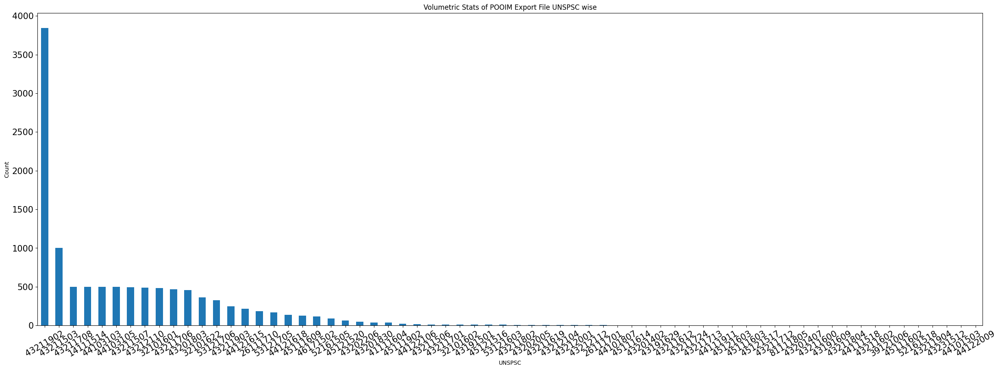

In [274]:
df = df_POOIM_Export['POOIM Primary Spec/Category'].value_counts()
df.plot(kind='bar', title='Volumetric Stats of POOIM Export File UNSPSC wise', ylabel='Count',
         xlabel='UNSPSC',fontsize=15, figsize=(30, 10))
plt.xticks(rotation=30)

In [275]:
for c in df_POOIM_Export['POOIM Primary Spec/Category']:
    print(c)
    print(df_POOIM_Export['POOIM Primary Spec/Category'].value_counts())

26111710
43211902    3844
43211503    1002
43211708     501
14111514     500
44103103     500
            ... 
52161518       1
43211904       1
43231512       1
44101503       1
44122009       1
Name: POOIM Primary Spec/Category, Length: 66, dtype: int64
26111710
43211902    3844
43211503    1002
43211708     501
14111514     500
44103103     500
            ... 
52161518       1
43211904       1
43231512       1
44101503       1
44122009       1
Name: POOIM Primary Spec/Category, Length: 66, dtype: int64
26111710
43211902    3844
43211503    1002
43211708     501
14111514     500
44103103     500
            ... 
52161518       1
43211904       1
43231512       1
44101503       1
44122009       1
Name: POOIM Primary Spec/Category, Length: 66, dtype: int64
26111710
43211902    3844
43211503    1002
43211708     501
14111514     500
44103103     500
            ... 
52161518       1
43211904       1
43231512       1
44101503       1
44122009       1
Name: POOIM Primary Spec/Category, L

In [275]:
print(df_POOIM_Export['POOIM Primary Spec/Category'].unique().tolist())

[26111710, 39121006, 26111701, 32101601, 43201402, 32101602, 43201407, 32101622, 43201803, 43202005, 43191501, 43201830, 43211600, 43211503, 43191609, 43202206, 43211507, 43211506, 43211708, 43211713, 43211902, 45111902, 43211802, 43211903, 52161505, 44111911, 43211904, 43231512, 43212001, 43211602, 45111602, 43212110, 43212112, 43212104, 44101503, 44101807, 44103103, 44103105, 45111609, 81111805, 45111614, 45121517, 45111603, 46171502, 53121706, 53121705, 52161518, 43211619, 44111518, 53121603, 43191629, 44122009, 14111514, 41111604, 43211706, 43211701, 43211724, 43211612, 43211712, 43211804, 44121615, 44122106, 44121618, 45121520, 45121516, 45121603]


In [276]:
# df_POOIM_Export['POOIM Primary Spec/Seller Category'].count()
# print(df_POOIM_Export['POOIM Primary Spec/Seller Category'].unique().tolist())
# df_POOIM_Export['POOIM Primary Spec/Seller Category'].unique()
# df_POOIM_Export['POOIM Primary Spec/Seller Category'].value_counts()

## Part B: Number of data points per unique UNSPSC

## 1) Count of all the secondary specs present in each unique UNSPSC Correct Category

In [277]:
df_POOIM_Export[df_POOIM_Export['POOIM Primary Spec/Category'] == 45121520]

,Unnamed: 0,Unnamed: 1,POOIM Primary Spec/Product ID,POOIM Primary Spec/Seller ID,POOIM Primary Spec/Buyer ID,POOIM Primary Spec/Version,POOIM Primary Spec/Identifiers/SKU,POOIM Primary Spec/Identifiers/UPC,POOIM Primary Spec/Identifiers/GTIN,POOIM Primary Spec/Identifiers/EAN,...,Scissors Secondary Spec/Shipping Depth/Display Value,Scissors Secondary Spec/Shipping Depth/Absolute Value,Scissors Secondary Spec/Shipping Depth/UOM,Scissors Secondary Spec/Shipping Weight _Approximate_/Display Value,Scissors Secondary Spec/Shipping Weight _Approximate_/Absolute Value,Scissors Secondary Spec/Shipping Weight _Approximate_/UOM,Scissors Secondary Spec/Recycled Content#0,Web cameras Secondary Spec/Color#1,Web cameras Secondary Spec/Device Supported#1,Web cameras Secondary Spec/Device Supported#2
0,Foundational Hierarchy /45000000/45120000/4512...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_222anj628,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826800362,222anj628,8.182498e+11,4.973163e+12,97855088505.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Foundational Hierarchy /45000000/45120000/4512...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_224bnm896,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826904464,224bnm896,1.953481e+11,1.953481e+11,195348129763.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Foundational Hierarchy /45000000/45120000/4512...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_223tzv963,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826888239,223tzv963,7.383069e+11,7.383069e+11,97855127204.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Foundational Hierarchy /45000000/45120000/4512...,NaN,87b00c11-fa06-4f49-93a1-f17d1ecc39c5_37088376,87b00c11-fa06-4f49-93a1-f17d1ecc39c5,8d847c55-5290-4094-a834-309961797c8b,1643834126155,37088376,9.785515e+10,9.785515e+10,4983943113098.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Foundational Hierarchy /45000000/45120000/4512...,Foundational Hierarchy /45000000/45120000/4512...,325b03e8-4d12-43df-8782-52f67ab2d38c_222acs989,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826756559,222acs989,9.785511e+10,3.672560e+10,818215349216.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,Foundational Hierarchy /45000000/45120000/4512...,NaN,87b00c11-fa06-4f49-93a1-f17d1ecc39c5_29901925,87b00c11-fa06-4f49-93a1-f17d1ecc39c5,8d847c55-5290-4094-a834-309961797c8b,1643834028852,29901925,9.785511e+10,3.672560e+10,818215349216.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118,Foundational Hierarchy /45000000/45120000/4512...,NaN,58ac6d3c-05fe-4d1c-9010-b2c5cf9f9800_222amt696,58ac6d3c-05fe-4d1c-9010-b2c5cf9f9800,8d847c55-5290-4094-a834-309961797c8b,1652119328875,222amt696,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
119,Foundational Hierarchy /45000000/45120000/4512...,NaN,58ac6d3c-05fe-4d1c-9010-b2c5cf9f9800_223tzv963,58ac6d3c-05fe-4d1c-9010-b2c5cf9f9800,8d847c55-5290-4094-a834-309961797c8b,1652119501250,223tzv963,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
120,Foundational Hierarchy /45000000/45120000/4512...,NaN,325b03e8-4d12-43df-8782-52f67ab2d38c_222alk367,325b03e8-4d12-43df-8782-52f67ab2d38c,8d847c55-5290-4094-a834-309961797c8b,1657826792877,222alk367,9.785510e+10,8.182157e+11,696551595838.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [278]:
# for i in df_POOIM_Export['POOIM Primary Spec/Category'].unique().tolist():
#     print(i)

In [ ]:
## Check for the secondary specs which are present and missing in every UNSPSCs
COL = []
perc_available = []
perc_missing= []
for i in df_POOIM_Export['POOIM Primary Spec/Category'].unique().tolist():
    # print(i)
    a = df_POOIM_Export[df_POOIM_Export['POOIM Primary Spec/Category']==i]
    # Finding all the column names in POOIM Export Catalog Excel file
    for col in a.columns:
        # print(col)
        COL.append(col)
    # print("All Column names present in POOIM Export Catalog: \n", COL)
    # Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
    for (columnName, columnData) in a.iteritems():
        # print('Column Name : ', columnName)
        # print('Column Contents : \n', columnData.values)
        row_count = columnData.shape[0]
        print('Row Count : ',row_count)
        rows_present = columnData.notnull().sum()
        print('Row values Present : ',rows_present)
        rows_absent = columnData.isna().sum()
        print('Row values Missing : ',rows_absent)
        rows_perc = (rows_present/row_count)*100
        print('Row values Present Perc : ',rows_perc ,"%")
        rows_missing_perc = (rows_absent/row_count)*100
        print('Row values Missing Perc : ',rows_missing_perc ,"%")
        perc_available.append(rows_perc)
        perc_missing.append(rows_missing_perc)
        print('*************************************************************')
    # print(" Different Columns present for every UNSPSCs : ", COL)
    print(" Total rows present for every UNSPSCs : ", row_count)
    print(" Total Percentage of Availability for every UNSPSCs : ", perc_available)
    print(" Total Percentage of Missing for every UNSPSCs : ", perc_missing)
    
    ## Part C: Columnwise Volumetric Stats for every UNSPSC
    col_names =  ['Column Name', 'Percentage Available']
    volumetric_stats  = pd.DataFrame(columns = col_names)
    volumetric_stats
    # append data in columns to an empty pandas DataFrame
    volumetric_stats['Column Name'] = COL
    volumetric_stats['Percentage Available'] = perc_available
    volumetric_stats
    ## Missing datapoints
    print(" Equal to 0 %: \n", volumetric_stats[volumetric_stats['Percentage Available'] == 0])
    volumetric_stats_category_missing= pd.concat([volumetric_stats[volumetric_stats['Percentage Available'] == 0]])
    # Present datapoints
    print(" Not Equal to 0 %: \n", volumetric_stats[volumetric_stats['Percentage Available'] != 0])
    volumetric_stats_category_available = pd.concat([volumetric_stats[volumetric_stats['Percentage Available'] != 0]])

Row Count :  187
Row values Present :  187
Row values Missing :  0
Row values Present Perc :  100.0 %
Row values Missing Perc :  0.0 %
*************************************************************
Row Count :  187
Row values Present :  0
Row values Missing :  187
Row values Present Perc :  0.0 %
Row values Missing Perc :  100.0 %
*************************************************************
Row Count :  187
Row values Present :  187
Row values Missing :  0
Row values Present Perc :  100.0 %
Row values Missing Perc :  0.0 %
*************************************************************
Row Count :  187
Row values Present :  187
Row values Missing :  0
Row values Present Perc :  100.0 %
Row values Missing Perc :  0.0 %
*************************************************************
Row Count :  187
Row values Present :  187
Row values Missing :  0
Row values Present Perc :  100.0 %
Row values Missing Perc :  0.0 %
*************************************************************
Row Count :  18

In [ ]:
# df_POOIM_Export[df_POOIM_Export['POOIM Primary Spec/Category'] == 52161505]
# ## Check for the secondary specs which are present and missing in every UNSPSCs
# b = df_POOIM_Export[df_POOIM_Export['POOIM Primary Spec/Category'] == 52161505]
# # Finding all the column names in POOIM Export Catalog Excel file
# COL = []
# for col in b.columns:
#     print(col)
#     COL.append(col)
# print("All Column names present in POOIM Export Catalog: \n", COL)
# # Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
# perc_available = []
# for (columnName, columnData) in b.iteritems():
#     # print('Column Name : ', columnName)
#     # print('Column Contents : \n', columnData.values)
#     row_count = columnData.shape[0]
#     print('Row Count : ',row_count)
#     rows_present = columnData.notnull().sum()
#     print('Row values Present : ',rows_present)
#     rows_absent = columnData.isna().sum()
#     print('Row values Missing : ',rows_absent)
#     rows_perc = (rows_present/row_count)*100
#     print('Row values Present Perc : ',rows_perc ,"%")
#     perc_available.append(rows_perc)
#     print('*************************************************************')
# ## Part C: Columnwise Volumetric Stats for every UNSPSC
# col_names =  ['Column Name', 'Percentage Available']
# volumetric_stats_b  = pd.DataFrame(columns = col_names)
# volumetric_stats_b
# # append data in columns to an empty pandas DataFrame
# volumetric_stats_b['Column Name'] = COL
# volumetric_stats_b['Percentage Available'] = perc_available
# volumetric_stats_b
# # Missing datapoints
# print(" Equal to 0 %: \n", volumetric_stats_b[volumetric_stats_b['Percentage Available'] == 0])
# # Available datapoints
# print(" Not Equal to 0 %: \n", volumetric_stats_b[volumetric_stats_b['Percentage Available'] != 0])

In [ ]:
## Total number of datapoints missing and available for Corrected Category
# # missing 
# volumetric_stats_category_missing = pd.concat([volumetric_stats_a[volumetric_stats_a['Percentage Available'] == 0], \
# volumetric_stats_b[volumetric_stats_b['Percentage Available'] == 0 ],\
# volumetric_stats_c[volumetric_stats_c['Percentage Available'] == 0 ],\
# volumetric_stats_d[volumetric_stats_d['Percentage Available'] == 0 ],\
# volumetric_stats_e[volumetric_stats_e['Percentage Available'] == 0 ],\
# volumetric_stats_f[volumetric_stats_f['Percentage Available'] == 0 ],\
# volumetric_stats_g[volumetric_stats_g['Percentage Available'] == 0]])
# print(volumetric_stats_category_missing)
# # available 
# volumetric_stats_category_available = pd.concat([volumetric_stats_a[volumetric_stats_a['Percentage Available'] != 0], \
# volumetric_stats_b[volumetric_stats_b['Percentage Available'] != 0 ],\
# volumetric_stats_c[volumetric_stats_c['Percentage Available'] != 0 ],\
# volumetric_stats_d[volumetric_stats_d['Percentage Available'] != 0 ],\
# volumetric_stats_e[volumetric_stats_e['Percentage Available'] != 0 ],\
# volumetric_stats_f[volumetric_stats_f['Percentage Available'] != 0 ],\
# volumetric_stats_g[volumetric_stats_g['Percentage Available'] != 0]])
# print(volumetric_stats_category_available)

In [ ]:
# ## B) Seller Category
# print(df_POOIM_Export['POOIM Primary Spec/Seller Category'].unique().tolist())
# df_POOIM_Export[df_POOIM_Export['POOIM Primary Spec/Seller Category'] == 45121520]
# ## Check for the secondary specs which are present and missing in every UNSPSCs
# A = df_POOIM_Export[df_POOIM_Export['POOIM Primary Spec/Seller Category'] == 45121520]
# # Finding all the column names in POOIM Export Catalog Excel file
# COL = []
# for col in A.columns:
#     print(col)
#     COL.append(col)
# print("All Column names present in POOIM Export Catalog: \n", COL)
# # Find the percentage of values present in all the column names in POOIM Export Catalog Excel file
# perc_available = []
# for (columnName, columnData) in A.iteritems():
#     # print('Column Name : ', columnName)
#     # print('Column Contents : \n', columnData.values)
#     row_count = columnData.shape[0]
#     print('Row Count : ',row_count)
#     rows_present = columnData.notnull().sum()
#     print('Row values Present : ',rows_present)
#     rows_absent = columnData.isna().sum()
#     print('Row values Missing : ',rows_absent)
#     rows_perc = (rows_present/row_count)*100
#     print('Row values Present Perc : ',rows_perc ,"%")
#     perc_available.append(rows_perc)
#     print('*************************************************************')
# ## Part C: Columnwise Volumetric Stats for every UNSPSC
# col_names =  ['Column Name', 'Percentage Available']
# volumetric_stats_A  = pd.DataFrame(columns = col_names)
# volumetric_stats_A
# # append data in columns to an empty pandas DataFrame
# volumetric_stats_A['Column Name'] = COL
# volumetric_stats_A['Percentage Available'] = perc_available
# volumetric_stats_A
# # Missing datapoints
# print(" Equal to 0 %: \n", volumetric_stats_A[volumetric_stats_A['Percentage Available'] == 0])
# # Available datapoints
# print(" Not Equal to 0 %: \n", volumetric_stats_A[volumetric_stats_A['Percentage Available'] != 0])

## Part C: Columnwise volumetric stats for every UNSPSC

In [ ]:
pwd

In [284]:
volumetric_stats_category_missing.to_excel("volumetric_stats_category_missing.xlsx")
volumetric_stats_category_available.to_excel("volumetric_stats_category_available.xlsx")

In [285]:
print(df_POOIM_Export.shape)
print(df_POOIM_Export.size)

(11593, 2345)
27185585
